#### Thank you for looking at this notebook. I think you'll find the pictures and sounds insightful and interesting. Please upvote and good luck on the competition!

#### ---Paul Alton Nussbaum

# Executive Summary
* This notebook allows the user to modify parameters along the classification pipeline and observe the results. As with traditional observation methods, the notebook lets users view input vectors for similar and different birds.
* In addition to traditional methods, this notebook also presents data in its original format (audio recordings of birds). This is intuitive for someone testing a microphone and recording system - they will want to listen to the recordings to see if they contain valid and useful information.
* The notebook extends this intuitive and useful technique to individual neural network layers - working backwards towards a best estimate of the original input (a system I call "reading the robot mind").
* The user can even provide just the "answer" (select a bird at the final output layer of the AI solution), and the reading the robot mind system will work backwards through the entire automated process and AI layers to let the user hear a best approximation of what it has learned that bird sounds like.
* You may be surprised at what you hear!

# Introduction
As an AI practitioner, you know the value of being able to explain your solutions to subject matter experts in ways that they are familiar with. 

#### Even when that expert is you!

If you designed a complex autonomous system, you would want to be able to check the data through every step of the process. Your autonomous system would be so open and transparent - you could observe the data at any point along the way. Most importantly, you would want that data presented in a format that is familiar to you. 

For example: If you are making an automated process that classifies birds, you'd want to test the microphones, the digital storage of the data, and the segmentation of the data stream to present for classification. You want to hear and possibly visualize the data quality every step of the way. In effect, you are taking a sequence of numbers stored on disk - an audio file segment - and recreating a best approximation of input (the sounds that the microphone sought to capture). If the recreated sound is garbled or otherwise doesn't contain enough information for you to hear the difference between different birds, you have a chance to correct the problem before moving on to the next step in your automated process. 

####  Don't you want a system to accomplish this for each layer of your AI?

I call this system "reading the robot mind."

It can be easily accomplished by simultaneously training auto-encoders along each layer of the network (able to recreate the best approximation of the original input from the data available at that stage of the process). Many shy from this approach because of the added computational cost and time - as competition forces a race to market. I think it is a mistake to skip this step because the training cost is minimal compared to inference costs if the solution is successful. As an example, I cite the currently running Kagle competition where these autoencoders were not trained along with the generative solution, and now there is a scramble to "read the robot mind," (https://www.kaggle.com/competitions/stable-diffusion-image-to-prompts) but there are many other examples, even with in-the-news stories about ChatGPT and the search for inputs that cause toxic or undesired responses.

I have created this notebook to show that it is possible to make a system to read the robot mind, even when those autoencoders were not trained alongside the network.

The notebook lets you hear, visualize, and compare data every step and layer on the way. It allows comparison of samples from the same type of bird (so you can see and hear if they are similar) and different birds (so you can see and hear if they are different) including:
* Segmentation
* Feature extraction (choice of Mel Spectrogram or MFCC, both having user selectable parameters)
* Conversion to image format for archival and training, including reduction to 8bit quantization.
* Each layer of a Conv2d, MaxPool combo model, followed by Dense embedding and Dense softmax categorizer.

This notebook provides the ability to work backwards through the system from any point and let the user see a best estimation of the features that were presented as input, as well as hear a best approximation of the bird recording from which they were extracted.

* v15 - Add some more explanatory documentation for publication, fine tune
* v14 - Allow working backwards from a manually selected classification "answer" back to a best approximation of the bird sound associated with that classification.
* v13 - Improve visualization
* v12 - Include dense layers
* v11 - include audio playback of deep layer reconstructions.
* v10 - Do not save image files if already saved, but allow tuning of feature extraction algorithms. Also visuallization into deep NN (multi-layer cumulative filters as well as visualizing input data as it makes its way through each layer of the network.
* v09 - Cleaning up code. Breaking out image saving, so it can be used in a different notebook. Also submission (depending on time required).
* v08 - Skipping segmentation adjustments (stick to 5 sec segments). Allow choice of Mel Spectrum or MFCC, and then choice of Mel Spectrum Band Counts and (if using MFCC) Coefficient counts.
* v07 - Explaining the parts of "Reading the Robot Mind"
* v06 - Experimenting with fidelity of transformations and reverse transformations.
* v05 - converting audio files into 5 second MFCC graphics images
* v01-v04 - starting from scratch to set up "reading the robot mind" examples.

## Loading the meta data

In [1]:
import pandas as pd

train_meta = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv")
total_data_count = len(train_meta)
print("There are a total of ", total_data_count, "  entries in the dataset")
# Uncomment the below two lines if you wish to see an example nmeta data entry.
# print("Here is the first entry in the dataset metadata:\n")
# print(train_meta.iloc[0])


There are a total of  16941   entries in the dataset


## IMPORTANT - If you are re-running this notebook, use only a few different bird types to speed up your experimentation
You can then switch to "all birds" once things are working to your satisfaction. See code block below.

In [2]:
# Create a list of all the possible classifications (labels)
labels = list(train_meta['primary_label'].unique())
print("There are ", len(labels), " different labels in the whole dataset.\n")
num_birds = len(labels)
epochs = 2

# Limit the number of birds to speed things up for the user
# Remove the next lines if using the entire set of birds
# num_birds = 9 # was 9
# labels = labels[0:num_birds]
# print("To speed things up, we are only using ", len(labels), " different labels (or birds).\n")
# epochs = 5 

There are  264  different labels in the whole dataset.



## The notebook will convert audio into images, the result of segmentation and feature extraction

In [3]:
image_data = []
for label in labels : 
    image_data.append(train_meta[train_meta["primary_label"] == label].iloc[:])
image_data = pd.concat(image_data).reset_index(drop=True) 
total_image_data_count = len(image_data)
print("There are ", total_image_data_count, " different entries in the image data set.\n")

There are  16941  different entries in the image data set.



In [4]:
# un-comment if you wish to see the meta data
#image_data

## Helper functions to transform and untransform (reverse transform) and save resultant features

In [5]:
# These functions will help transform and untransform (reverse transformation) as well as
# reducing the resolution of floating point feature values into 8-bit unsigned integers.
# The goal is to convert each 5 second segment of auio into a 2D greyscale image of 8-bit uints.
# After this is done, we can use these images as inputs to our classifier.

import librosa 
import numpy as np
from PIL import Image
import os
import soundfile as sf
# from tqdm import tqdm


# Convert 1D audio amplitude over time, to another domain (2 dimensional "image")
#####################################################
###                                               ###
### ALLOW USER TO MODIFY THESE AND SEE THE IMPACT ###
###                                               ###
#####################################################
use_mfcc = False # otherwise use Mel Spectrogram
n_mels = 64 # used for both Mel Spectrogram and MFCC
n_coeff = 64 # number of cepstral coefficients (only used for MFCC)


# Image dimensions
if use_mfcc :
    if n_coeff < n_mels :
        num_rows = n_coeff 
    else :
        num_rows = n_mels
else :
    num_rows = n_mels
num_columns = 313 # number of MFCC frames generated from 160000 samples of sudio (5 sec at 32000)
num_channels = 1

# MAY BE A MISTAKE TO MAKE THIS A GLOBAL VALUE - but it's always forced to 32000
sr = 32000 # default sampling rate if none provided

Window_Size = 5 # 5 seconds
# Get number of samples for 5 seconds
segment = Window_Size * sr


def Audio_to_Domain(y, sr):
    if use_mfcc:
        feat = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_coeff, n_mels=n_mels, power=3) # raise to 3rd power before extracting coefficients to reduce noise
    else :
        feat = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, power=1)
    if feat.shape[1] <= num_columns:
        pad_width = num_columns - feat.shape[1]
        feat = np.pad(feat, pad_width=((0,0),(0,pad_width)), mode='constant')
    return feat

def Domain_to_Audio(feat, sr):
    if use_mfcc :
        y = librosa.feature.inverse.mfcc_to_audio(feat, sr=sr, n_mels=n_mels, power=3)
    else :
        y = librosa.feature.inverse.mel_to_audio(feat, sr=sr, power=1) 
    return y


def Audio_Segment_Transform_and_Save(file_path, cat_name='dummy', is_save=True, train=True, sr=sr):

    # First load the file
    filename = file_path.replace("/", "_")
    file_path = "/kaggle/input/birdclef-2023/train_audio/" + file_path
    audio, sr = librosa.load(file_path, sr = sr)

    # Get number of samples for 5 seconds
    buffer = segment

    samples_total = len(audio)
    samples_wrote = 0
    counter = 1

    # this will be a list of 5 second segments
    feature_split = []
    # each segment will have its own filename
    feature_filenames = []
    # each segment will also have its own min and range value for reconstruction (reverse transformation)
    feature_mins = []
    feature_ranges = []
    while samples_wrote < samples_total:
        #check if the buffer is not exceeding total samples 
        if buffer > (samples_total - samples_wrote):
            buffer = samples_total - samples_wrote

        block = audio[samples_wrote : (samples_wrote + buffer)]
        these_features = Audio_to_Domain(block, sr)
        feature_split.append(these_features)

        # Write Window_Size second segment
        if is_save == True:
            # had to add the letter "z" in front of my output files and paths, becuase contest submission searches output files alphabetically (!?)
            out_filename = "/kaggle/working/zimages/" + cat_name + \
                "/split_" + str(counter) + "_" + filename + ".png"
            
            feature_filenames.append(out_filename)
            
            # convert the features into an image for saving
            
            #scale to 0 - 255
            fmax = these_features.max()
            fmin = these_features.min()
            frange = fmax - fmin
            # these_features = 255 * ((these_features - fmin)/frange)
            these_features = np.array((((these_features - fmin) / frange)*255), dtype='uint8')
            # save the min and range for later reconstruction (reverse transform, or un-transform) back to audio
            feature_mins.append(fmin)
            feature_ranges.append(frange)
            this_image = Image.fromarray(these_features, mode = 'L')
            # make the directory if it doesn't yet exist
            if not os.path.exists(os.path.dirname(out_filename)):
                try:
                    os.makedirs(os.path.dirname(out_filename))
                except OSError as exc: # Guard against race condition
                    if exc.errno != errno.EEXIST:
                        raise            
            # save the file
            this_image.save(out_filename, format="PNG")
            
        counter += 1
        samples_wrote += buffer
    return feature_split, sr, feature_filenames, feature_mins, feature_ranges

def Load_and_UnTransform(filename):
    this_image = Image.open(filename)
    block = Domain_to_Audio(this_image, sr)
    return block, sr
    

def Save_Features(_df, train=True):
    data = []

    if os.path.exists(os.path.dirname("/kaggle/working/zimages/")):
        print("WARNING: Image files already saved. Aborting save to avoid corrupted image databse.")
        data_df = pd.DataFrame(data, columns=['primary_label', 'original_filename', 'filename', 'fmin', 'frange'])
        # had to add the letter z in front of filenames and paths so competition submission can find the output file (alphabetically)
        data_df = pd.read_csv("/kaggle/working/zimages.csv")
    else:
        for index, row in _df.iterrows(): # was tqdm(_df.iterrows()):
            audio_lst, sr, filenames, mins, ranges = Audio_Segment_Transform_and_Save(row["filename"], cat_name = row["primary_label"], is_save = True, train = train)
            for idx, y in enumerate(audio_lst):
                data.append([row["primary_label"], row["filename"], filenames[idx], mins[idx], ranges[idx]])
    
        data_df = pd.DataFrame(data, columns=['primary_label', 'original_filename', 'filename', 'fmin', 'frange'])
        data_df.to_csv("/kaggle/working/zimages.csv", index=False)

    return data_df
    
    


# See and Hear the Feature Extraction
#### Try a number of Feature Extraction Algorithms and test the following:
* Do the features visually look similar for the same bird, and different for different birds?
* Is the similarity/difference enough to be able to visually classify which bird is which?
* What about the audio - is the recreated sound clear enough for an expert to identify the bird?
* If the answer is "no" to any of the above, allow fine tuning by the user (three different feature extractions are compared below)

In [6]:
# Visually examine feature extraction algorithms
import IPython
import matplotlib.pyplot as plt

def Compare_Feature_Extraction(image_data, list_to_compare) :
    global sr, segment
    list_len = len(list_to_compare)
    if list_len < 2 :
        print("Must provide at least 2 items - cannot compare.\n")
        return()
    else:
        plt.figure(figsize=(10, 10))
        for i in range(list_len):
            # grab from the image set
            audio_filename = image_data.at[list_to_compare[i],"filename"]
            common_name = image_data.at[list_to_compare[i],"common_name"]
            # load the audio data
            audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
            # Take first 5 second "segment"
            audio = audio[0:segment]
            # Extract the feaures
            feat = Audio_to_Domain(audio, sr)
            # Move the range from current min and max, into 0 to 255 8 bit integers
            fmin = feat.min()
            fmax = feat.max()
            frange = fmax - fmin
            feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
            # Plot the features
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(feat, cmap='gray', aspect=(num_columns/num_rows), interpolation = 'None')
#            plt.imshow(images[i].numpy().astype("uint8"), cmap='gray', aspect=(num_columns/num_rows), interpolation = 'None')
            plt.title(common_name)
            plt.axis("off")
    return()


## Let's start with Mel Scale Frequency Spectrum feature extraction, with a resultant 16 mel scale bands

In [7]:
#####################################################
###                                               ###
### ALLOW USER TO MODIFY THESE AND SEE THE IMPACT ###
###                                               ###
#####################################################
use_mfcc = False # otherwise use Mel Spectrogram
n_mels = 16 # used for both Mel Spectrogram and MFCC
n_coeff = 1 # number of cepstral coefficients (only used for MFCC)

# These are calculated based on user selections
# Image dimensions
if use_mfcc :
    if n_coeff < n_mels :
        num_rows = n_coeff 
    else :
        num_rows = n_mels
else :
    num_rows = n_mels

Compare features from the SAME birds (first 5 sec of audio used)



()

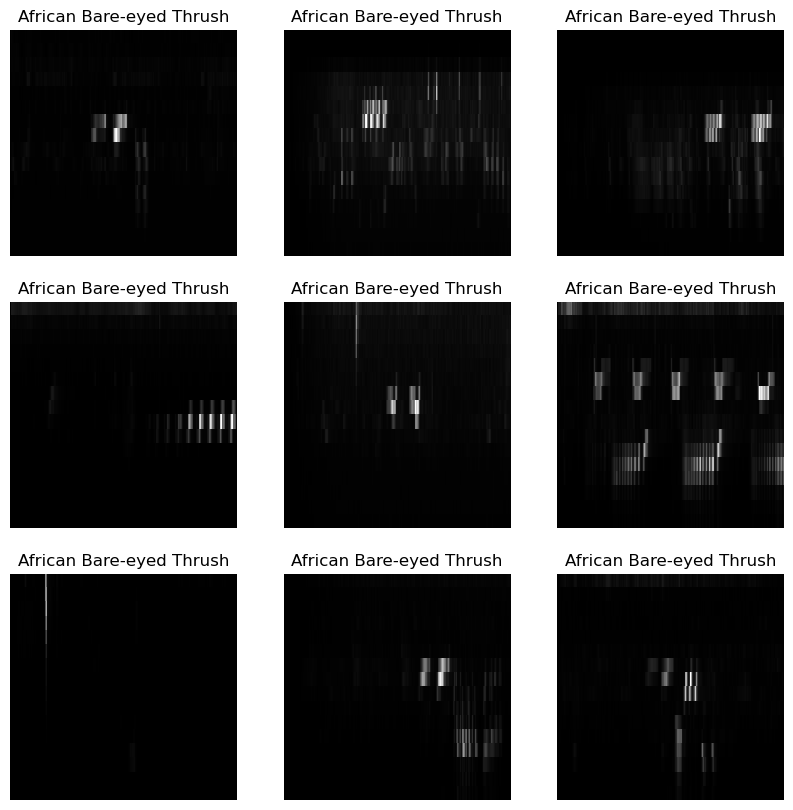

In [8]:
print("Compare features from the SAME birds (first 5 sec of audio used)\n")            
# Compare the first few entries in the image_data
Compare_Feature_Extraction(image_data, [0, 1, 2, 3, 4, 5, 6, 7, 8])

### The above shows extracted features for sounds samples from the same bird
* Comparing features from the same bird yields some similarities, but also differences (maybe different songs of the same bird)
* Notice how the third from last (lower left) seems to have not much of a signal (we are not changing segmentation algorithms, but maybe there is a problem with segmentation in that the 5 sec window starting from the beginning of audio, might not be an optimal window).
* Maybe we are throwing away too much information.

Compare features from the DIFFERENT birds (first 5 sec of audio used)



()

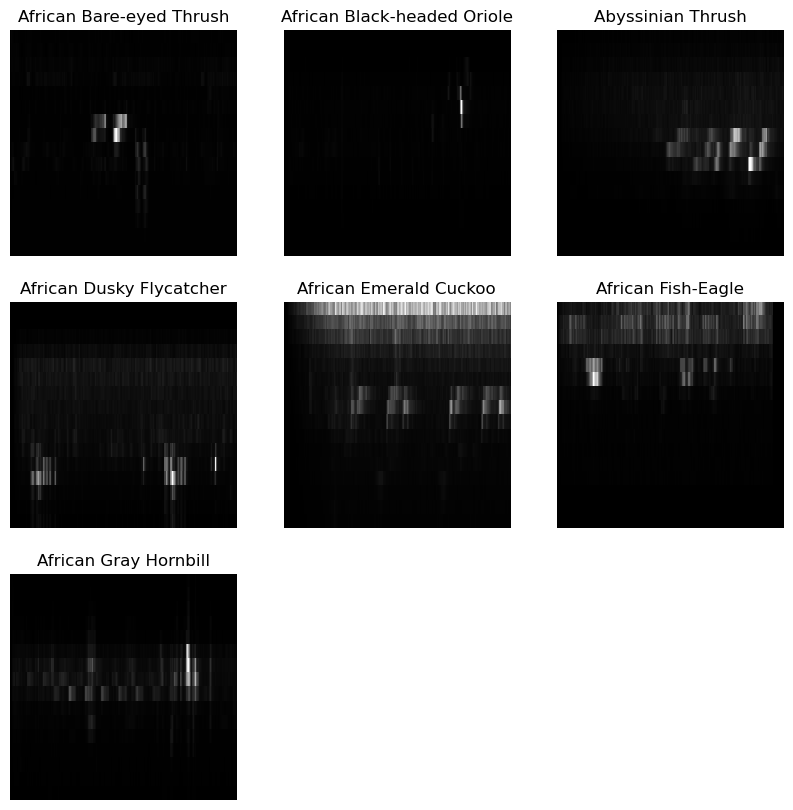

In [9]:
print("Compare features from the DIFFERENT birds (first 5 sec of audio used)\n")            
# Compare the first 10 entries in the image_data
Compare_Feature_Extraction(image_data, [0, 50, 150, 200, 225, 350, 430])

### The above shows extracted features for sounds samples from DIFFERENT birds
* Comparing features from the different birds yields sufficient differences

## Finally, let's listen to the untransformation (recreate audio from the extracted features)
* We'll only listen to the first segment from the first bird

In BLUE is the original audio of the first segment of the first audio file

Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file

This is the audio playback of the ORIGINAL audio file


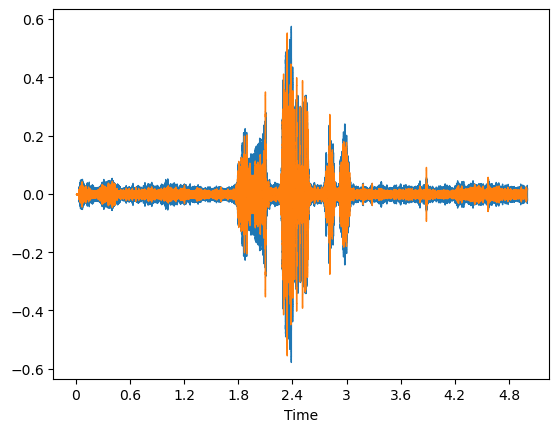

In [10]:
audio_filename = image_data.at[0,"filename"]
common_name = image_data.at[0,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]
# Extract the feaures
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
# Go back to the original range of values
feat = ((feat/255)*frange)+fmin
# Recreate the audio from the extracted features
recreated_audio = Domain_to_Audio(feat, sr)

print("In BLUE is the original audio of the first segment of the first audio file\n")
librosa.display.waveshow(audio, sr=sr)

print("Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file\n")
librosa.display.waveshow(recreated_audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

In [11]:
print("This is the audio playback of the RECREATED audio file")
IPython.display.Audio(data = recreated_audio, rate=sr)

This is the audio playback of the RECREATED audio file


## The above lets us listen to recreation of the original input from the Extracted Features
* The audio is a bit garbled but still clearly a bird call
* The real question is "will a human expert be able to use the RECREATED audio to correctly classify birds."
* The answer will be a qualitative measure of the feature extraction algorithm

## Now let's try another Feature Extraction Algorithm
### This time let's try MFCC with 16 coefficients

In [12]:
# Convert 1D audio amplitude over time, to another domain (2 dimensional "image")
#####################################################
###                                               ###
### ALLOW USER TO MODIFY THESE AND SEE THE IMPACT ###
###                                               ###
#####################################################
use_mfcc = True # otherwise use Mel Spectrogram
n_mels = 64 # used for both Mel Spectrogram and MFCC
n_coeff = 16 # number of cepstral coefficients (only used for MFCC)


# Image dimensions
if use_mfcc :
    if n_coeff < n_mels :
        num_rows = n_coeff 
    else :
        num_rows = n_mels
else :
    num_rows = n_mels

Compare features from the SAME birds (first 5 sec of audio used)



()

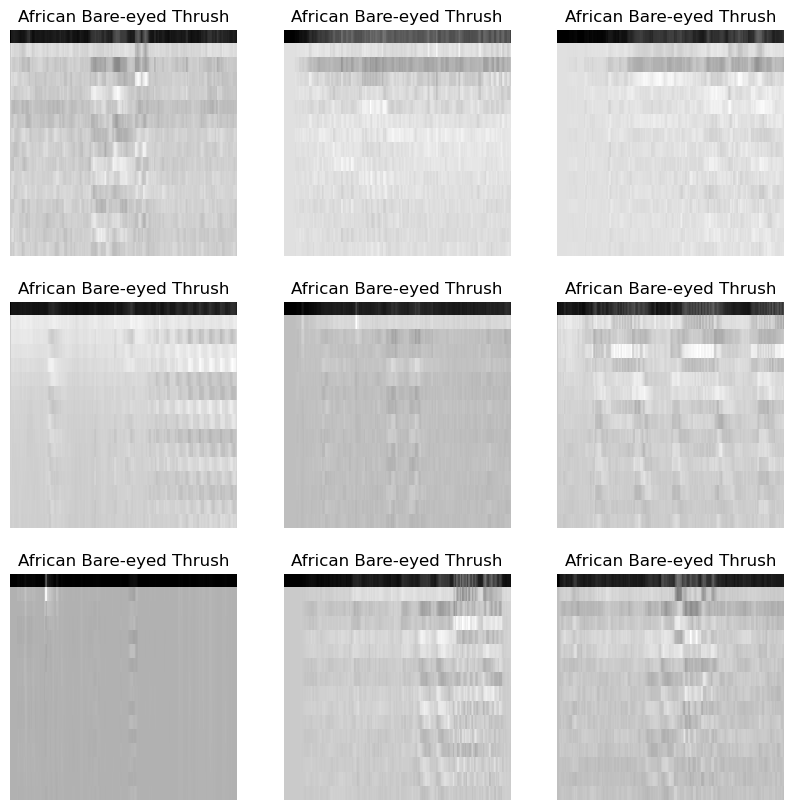

In [13]:
print("Compare features from the SAME birds (first 5 sec of audio used)\n")            
# Compare the first 10 entries in the image_data
Compare_Feature_Extraction(image_data, [0, 1, 2, 3, 4, 5, 6, 7, 8])

### The above shows extracted features for sounds samples from the same bird### The above showed...
* Comparing features from the same bird yields fewer similarities, and many differences
* Maybe we are throwing away too much information.

Compare features from the DIFFERENT birds (first 5 sec of audio used)



()

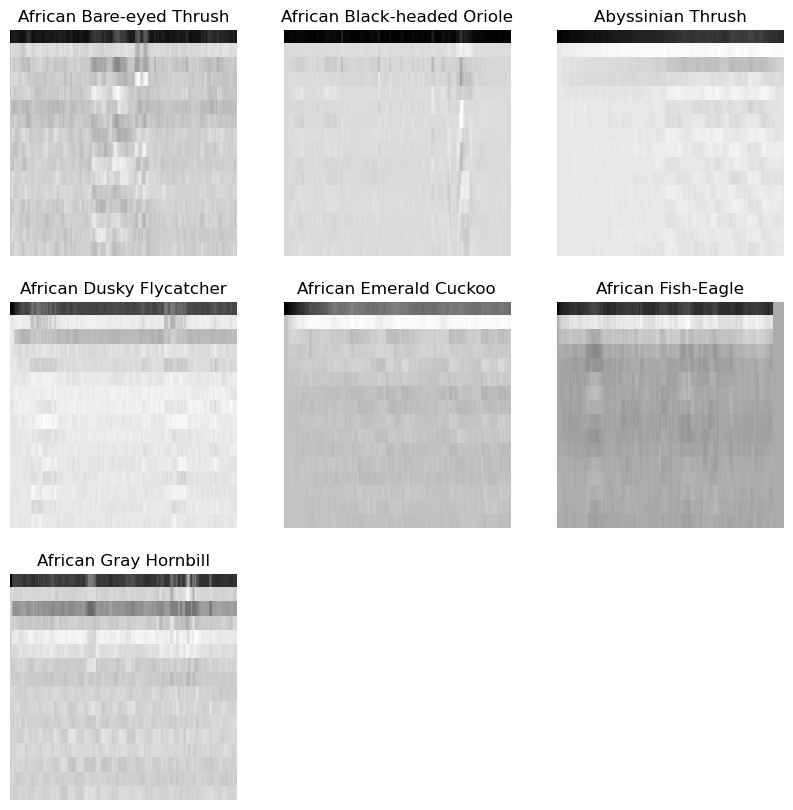

In [14]:
print("Compare features from the DIFFERENT birds (first 5 sec of audio used)\n")            
# Compare the first 10 entries in the image_data
Compare_Feature_Extraction(image_data, [0, 50, 150, 200, 225, 350, 430])

### The above shows extracted features for sounds samples from DIFFERENT birds
* Different birds indeed seem to have different features, but also striking similarities (Emerald Cuckoo and Fish-Eagle)
* Not sure if "different versus similar" birds really jump out at me personally when I view these
* Not sure if a bird expert would use these images to classify birds.

## Let's listen to the untransformation (recreate audio from the extracted features)
* We'll only listen to the first segment from the first bird

In BLUE is the original audio of the first segment of the first audio file

Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file

This is the audio playback of the ORIGINAL audio file


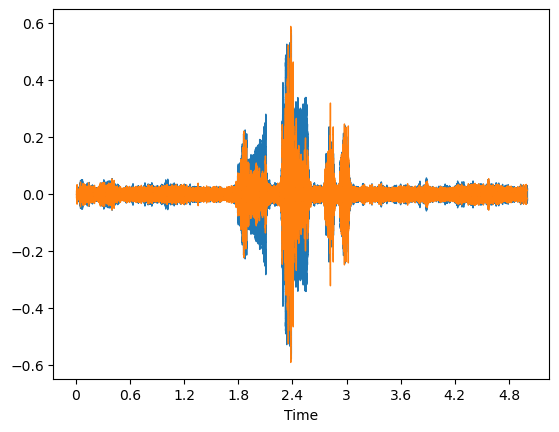

In [15]:
audio_filename = image_data.at[0,"filename"]
common_name = image_data.at[0,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]
# Extract the feaures
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
# Go back to the original range of values
feat = ((feat/255)*frange)+fmin
# Recreate the audio from the extracted features
recreated_audio = Domain_to_Audio(feat, sr)

print("In BLUE is the original audio of the first segment of the first audio file\n")
librosa.display.waveshow(audio, sr=sr)

print("Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file\n")
librosa.display.waveshow(recreated_audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

In [16]:
print("This is the audio playback of the RECREATED audio file")
IPython.display.Audio(data = recreated_audio, rate=sr)

This is the audio playback of the RECREATED audio file


## The above lets us listen to recreation of the original input from the Extracted Features## The above showed
* The audio is a bit garbled but better than just the 16 band Mel Scale Spectrum - still clearly a bird call
* The real question is "will a human expert be able to use the RECREATED audio to correctly classify birds."
* The answer will be a qualitative measure of the feature extraction algorithm
* From my non-expert listening, I'd say these 16 parameters are better than the prior 16 parameters (audio wise)

## Finally; let's finish with a 32 Mel Scale frequency band feature extraction

In [17]:
# Convert 1D audio amplitude over time, to another domain (2 dimensional "image")
#####################################################
###                                               ###
### ALLOW USER TO MODIFY THESE AND SEE THE IMPACT ###
###                                               ###
#####################################################
use_mfcc = False # otherwise use Mel Spectrogram
n_mels = 32 # used for both Mel Spectrogram and MFCC
n_coeff = 1 # number of cepstral coefficients (only used for MFCC)


# Image dimensions
if use_mfcc :
    if n_coeff < n_mels :
        num_rows = n_coeff 
    else :
        num_rows = n_mels
else :
    num_rows = n_mels

Compare features from the SAME birds (first 5 sec of audio used)



()

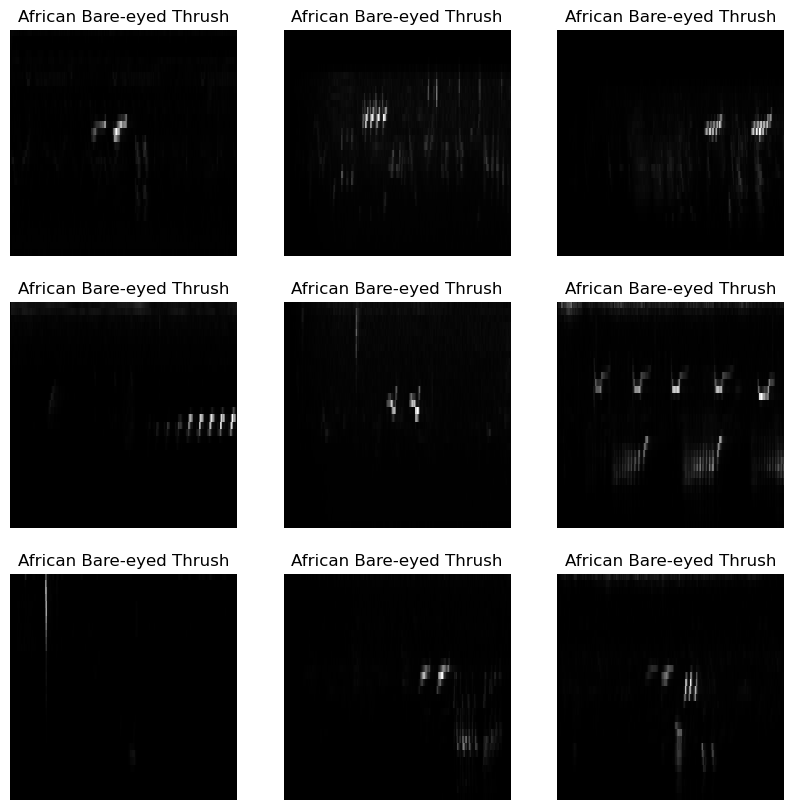

In [18]:
print("Compare features from the SAME birds (first 5 sec of audio used)\n")            
# Compare the first 10 entries in the image_data
Compare_Feature_Extraction(image_data, [0, 1, 2, 3, 4, 5, 6, 7, 8])

### The above shows extracted features for sounds samples from the same bird
* Comparing features from the same bird now yields more similarities
* Seems like now we have plenty of information (maybe too much? Will it slow down our training algorithm or cause it to overfit?)

Compare features from the DIFFERENT birds (first 5 sec of audio used)



()

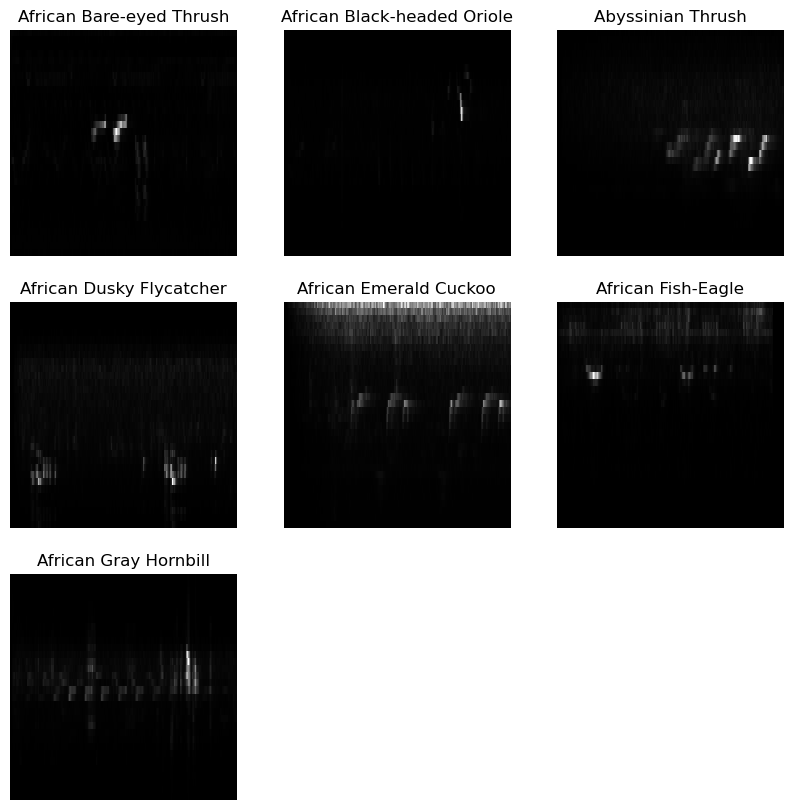

In [19]:
print("Compare features from the DIFFERENT birds (first 5 sec of audio used)\n")            
# Compare the first 10 entries in the image_data
Compare_Feature_Extraction(image_data, [0, 50, 150, 200, 225, 350, 430])

### The above shows extracted features for sounds samples from DIFFERENT birds
* Different birds indeed seem to have different features, but also instantaneous similarities (which may be differentiated as they change over time). 
* "Different versus similar" birds start to make itself more visible, but with regard to that time window, it looks like 1.5 to 2 seconds of changing notes might be needed to differentiate birds (since there are 313 samples in a 5 second window, this equates to 95 to 125 feature vectors.
* Still not sure if a bird expert would use these images to classify birds.

## Let's listen to the untransformation (recreate audio from the extracted features)
* We'll only listen to the first segment from the first bird

In BLUE is the original audio of the first segment of the first audio file

Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file

This is the audio playback of the ORIGINAL audio file


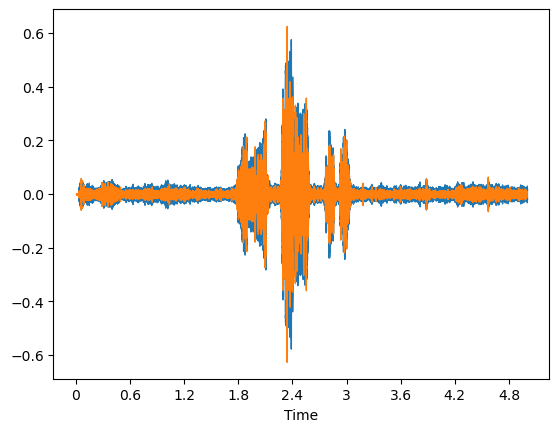

In [20]:
audio_filename = image_data.at[0,"filename"]
common_name = image_data.at[0,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]
# Extract the feaures
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
# Go back to the original range of values
feat = ((feat/255)*frange)+fmin
# Recreate the audio from the extracted features
recreated_audio = Domain_to_Audio(feat, sr)

print("In BLUE is the original audio of the first segment of the first audio file\n")
librosa.display.waveshow(audio, sr=sr)

print("Superimposed in ORANGE the RECREATED (un-transformed) audio of the first segment of the first image file\n")
librosa.display.waveshow(recreated_audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

In [21]:
print("This is the audio playback of the RECREATED audio file")
IPython.display.Audio(data = recreated_audio, rate=sr)

This is the audio playback of the RECREATED audio file


## The above lets us listen to recreation of the original input from the Extracted Features## The above showed
* The audio is definitely more clear
* It seems obvious that "a human expert will be able to use the RECREATED audio to correctly classify birds."
* Naturally, if they couuld perform the classification with the raw audio
* Segmentation is still the open question - if the 5 second window does not containt enough of that bird's call, etc...

# Save Training Data
## For each raw audio file, we will use the selected Feature Extraction to convert the audio into feature files to be used for training
* Segment using non-verlapping 5 minute windows (tail-end windows may be shorter, ignore FFT warnings and pad with 0's)
* Perform the selected feature extraction, converting the 1D audio into the 2D image (pixels are 8-bit resolution)
* Save these images to be used as a dataset for training
* Also save the scaling factors for each image in the data set (so we can use it to recreate audio). Scaling factor is not used by the NN.

In [22]:
import time 

def Save_Image_Examples():
    global image_df, n_mels, n_coeff, use_mfcc, num_rows
    # Image dimensions
    if use_mfcc :
        if n_coeff < n_mels :
            num_rows = n_coeff 
        else :
            num_rows = n_mels
    else :
        num_rows = n_mels

    print("Starting to save Images. Please wait...\n")
    start_time = time.time()
    image_df = Save_Features(image_data, train=True)
    end_time = time.time()
    print("Total amount of time to convert and save image data is ", (end_time - start_time), 
          " seconds\n")
    return

In [23]:
print("There are ", total_image_data_count, " different entries in the audio files data set.\n")
Save_Image_Examples()
#Save_Validation_Examples()

There are  16941  different entries in the audio files data set.

Starting to save Images. Please wait...



/opt/conda/lib/python3.7/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=940
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
/opt/conda/lib/python3.7/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1463
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
/opt/conda/lib/python3.7/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1536
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
/opt/conda/lib/python3.7/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=627
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
/opt/conda/lib/python3.7/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1024
  f"n_fft={n_fft} is

Total amount of time to convert and save image data is  4349.741828680038  seconds



# Test Saved Training Data
## Let's make sure everything got saved properly
* Read in one of the saved image files
* View the features (as an image file)
* Untransform the extracted features so we can see and hear the reconstructed audio

In [24]:
import PIL
# Let's look and at the first validation transformed image data 
# Read in the first validation segment graphic
transformed_file = image_df.at[0,"filename"]
original_file = image_df.at[0,"original_filename"]

trans_1 = PIL.Image.open(transformed_file)
print("Shape of loaded image  ", trans_1.height, trans_1.width)
audio_1, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + original_file, sr = sr)
# Let's look only at the first segment (of size segment = 5 sec * sampling rate)
audio_1 = audio_1[0:segment]

Shape of loaded image   32 313


This is the original audio, (segmented but not transformed) visually displayed as a graphic file


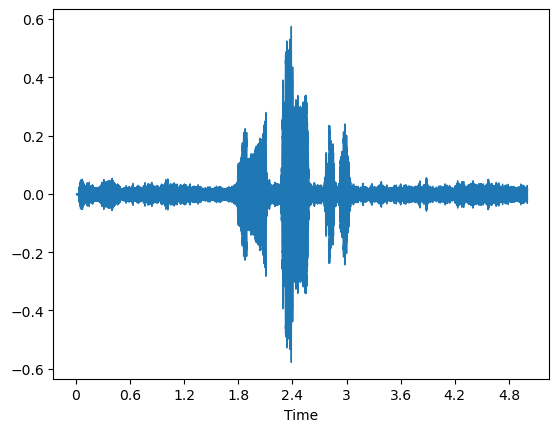

In [25]:
print("This is the original audio, (segmented but not transformed) visually displayed as a graphic file")
librosa.display.waveshow(audio_1, sr=sr)

In [26]:
import IPython

IPython.display.Audio(data = audio_1, rate=sr)

Shape of loaded image (height and width) 32 313
Graphic of loaded image file
Here is the image file that was loaded



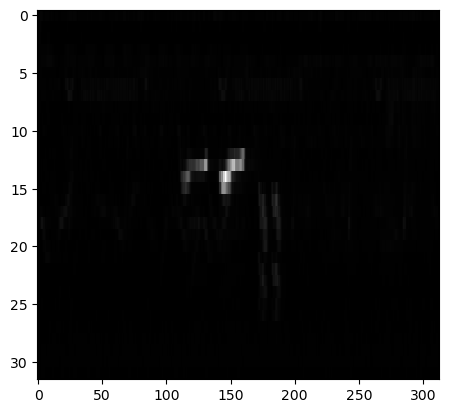

In [27]:
print("Shape of loaded image (height and width)", trans_1.height, trans_1.width)
print("Graphic of loaded image file")
print("Here is the image file that was loaded\n")
plt.imshow(trans_1, cmap='gray', aspect=int(num_columns/num_rows) , interpolation = 'None')
plt.show() 

shape of image array: (32, 313)
Before scaling, image has values within this range:  0 255
After scaling, normalized transform has values within this range:  0.00015478511340916157 2.392117313342169
This is the recreated audio, (un-transformed) visually displayed as a graphic file


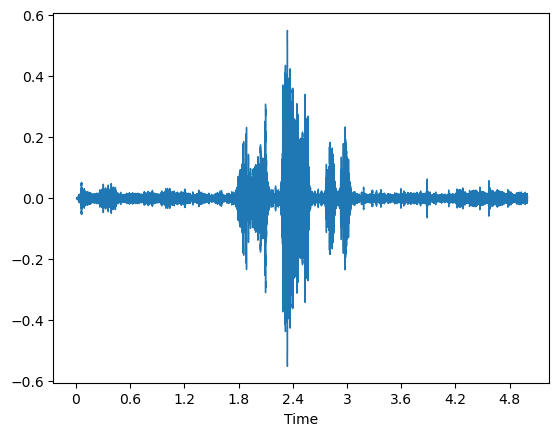

In [28]:
# Convert the transformed data back into an audio file
norm_trans = np.array(trans_1)
print("shape of image array:", norm_trans.shape)
print("Before scaling, image has values within this range: ", norm_trans.min(), norm_trans.max())
# re-scale the transformation back to its original min, max, and range, using the values we saved earlier
rescale_factor = image_df.at[0,"frange"]/255
rescale_shift = image_df.at[0,"fmin"]
norm_trans = (norm_trans * rescale_factor) + rescale_shift

print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [29]:
IPython.display.Audio(data = untrans_1, rate=sr)

## The above shows...
* We have successfully created a new dataset, of image files, instead of audio files
* We have confidence about the information content of the saved data containing the extracted features
* * This is qualitatively shown using the "Reading the Robot Mind" method of seeing if a human expert can classify the untransformed audio

# Build Convolutional Neural Network
## Build a simple CNN to perform classification
* Use sequences of Conv2D and MaxPool to find edges, textures, and patterns
* NOTE: You can change Conv2D filter counts and shapes, as well as MaxPool2D shapes, but if you add or remove layers, you'll need to modify the backwards process (manually coded later in the notebook) as I have not yet implemented a method that figures out the layer structure automatically.

In [30]:
from tensorflow import keras
from keras.models import Model
from keras.layers import Dense,Conv2D,Flatten,MaxPool2D,Concatenate, Activation
from keras.layers import Dropout,BatchNormalization, Input, Rescaling

inputs = Input(shape = (num_rows, num_columns, 1))

# Rescale the input (arrives as 0-255 8-bit uint grayscale pixels)
model = Rescaling(1./255)(inputs)

# This model has a sequential set of Conv2D and MaxPool layers finished with a 32 Dense 
# In this way, the model seeks to embed the entire image into a 32 dim vector
model1 = Conv2D(filters=16, kernel_size=(3, 3), padding='SAME', activation='relu')(model)   # was 32 filters
model1 = Conv2D(filters=16, kernel_size=(3, 3), padding='SAME', activation='relu')(model1)  # was 32 filters
model1 = MaxPool2D(pool_size=(2, 2))(model1)

model1a = Conv2D(filters=32, kernel_size=(5, 5), padding='SAME', activation='relu')(model1) # was 64 filters
model1a = Dropout(0.2)(model1a)
model1a = Conv2D(filters=16, kernel_size=(3, 3), padding='SAME', activation='relu')(model1a)# was 32 filters
model1a = Dropout(0.2)(model1a)

model1b = Conv2D(filters=16, kernel_size=(3, 3), padding='SAME', activation='relu')(model1a)# was 32 filters
model1b = Conv2D(filters=16, kernel_size=(3, 3), padding='SAME', activation='relu')(model1b)# was 32 filters
# Lets compress the time down
model1b = MaxPool2D(pool_size=(2, 2))(model1b)

model1c = Conv2D(filters=32, kernel_size=(5, 5), padding='SAME', activation='relu')(model1b)# was 64 filters

# Flatten and use Dense to find a lower dim embedding
model1c = Flatten()(model1c)
model1c = Dense(64, activation = "relu")(model1c)

bird_classification = Dense(num_birds, activation = 'softmax')(model1c)

model = Model(inputs=inputs, outputs=bird_classification)

## Here you can see the Model Summary

In [31]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 313, 1)]      0         
                                                                 
 rescaling (Rescaling)       (None, 32, 313, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 32, 313, 16)       160       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 313, 16)       2320      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 156, 16)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 156, 32)       12832     
                                                             

## Here you can see the architecture of the model

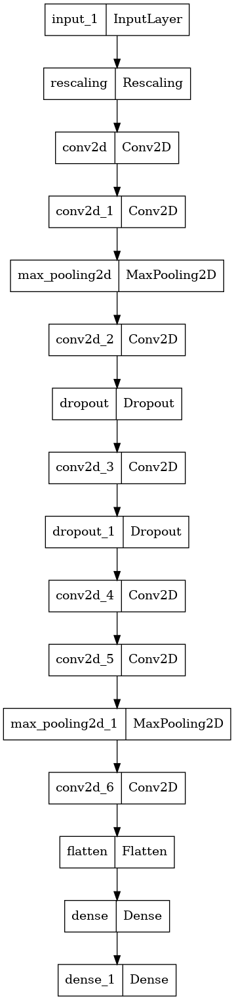

In [32]:
import tensorflow as tf
tf.keras.utils.plot_model(model)

# Setup Training Pipeline
## Use a pipeline for training with "image_dataset_from_directory" for simplicity

In [33]:
import tensorflow as tf
import tensorflow_datasets as tfds

batch_size = 256 # was 32 # num_birds

img_height = num_rows
img_width = num_columns

print("Use dataset_from_directory to gather training images.\n")
train_ds = tf.keras.utils.image_dataset_from_directory(
  "/kaggle/working/zimages/",
  validation_split=0.2,
  subset="training",
  seed=111,    
  image_size=(img_height, img_width),
  color_mode = "grayscale",
  label_mode = 'categorical',
  batch_size=batch_size)

print("\nClass names for training are: ", train_ds.class_names)

print("\nUse dataset_from_directory to gather validation images.\n")
val_ds = tf.keras.utils.image_dataset_from_directory(
  "/kaggle/working/zimages/",
  validation_split=0.2,
  subset="validation",
  seed=111,
  image_size=(img_height, img_width),
  color_mode = "grayscale",
  label_mode = 'categorical',
  batch_size=batch_size)
print("\nClass names for validation are: ", val_ds.class_names)


Use dataset_from_directory to gather training images.

Found 147248 files belonging to 264 classes.
Using 117799 files for training.

Class names for training are:  ['abethr1', 'abhori1', 'abythr1', 'afbfly1', 'afdfly1', 'afecuc1', 'affeag1', 'afgfly1', 'afghor1', 'afmdov1', 'afpfly1', 'afpkin1', 'afpwag1', 'afrgos1', 'afrgrp1', 'afrjac1', 'afrthr1', 'amesun2', 'augbuz1', 'bagwea1', 'barswa', 'bawhor2', 'bawman1', 'bcbeat1', 'beasun2', 'bkctch1', 'bkfruw1', 'blacra1', 'blacuc1', 'blakit1', 'blaplo1', 'blbpuf2', 'blcapa2', 'blfbus1', 'blhgon1', 'blhher1', 'blksaw1', 'blnmou1', 'blnwea1', 'bltapa1', 'bltbar1', 'bltori1', 'blwlap1', 'brcale1', 'brcsta1', 'brctch1', 'brcwea1', 'brican1', 'brobab1', 'broman1', 'brosun1', 'brrwhe3', 'brtcha1', 'brubru1', 'brwwar1', 'bswdov1', 'btweye2', 'bubwar2', 'butapa1', 'cabgre1', 'carcha1', 'carwoo1', 'categr', 'ccbeat1', 'chespa1', 'chewea1', 'chibat1', 'chtapa3', 'chucis1', 'cibwar1', 'cohmar1', 'colsun2', 'combul2', 'combuz1', 'comsan', 'crefra2', '

## Visualize the data
Here are the first few images from the training dataset.

# Test Training Pipeline
## Double check that the saved images are correctly read by the pipeline

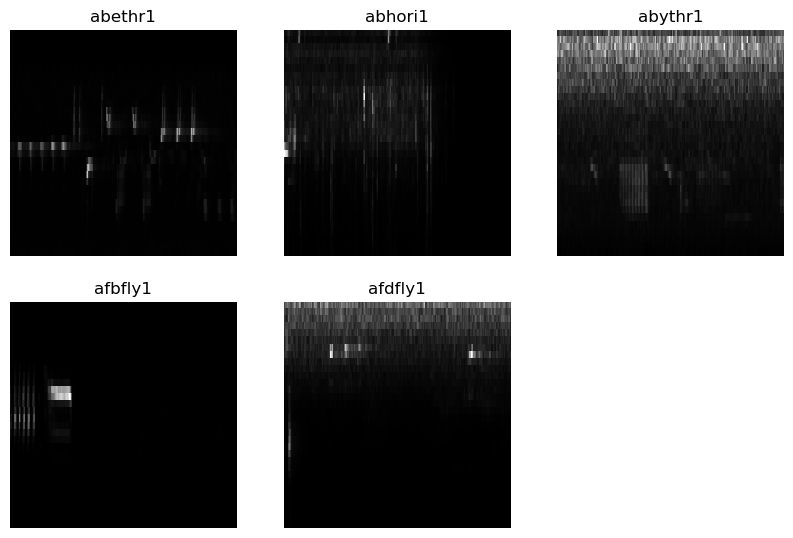

In [34]:
import matplotlib.pyplot as plt

class_names = train_ds.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(5):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"), cmap='gray', aspect=(num_columns/num_rows), interpolation = 'None')
    plt.title(class_names[i])
    plt.axis("off")

# Train the CNN
## Train the Neural Network over a few Epochs

In [35]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [36]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# Had to add the letter "z" in front of filenames and paths written to output, because Conteste submission only lists the first few ouputs alphabetically
checkpoint_model_path = "/kaggle/working/zclassifier"
metric = "val_accuracy"

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer = ModelCheckpoint(
    filepath=checkpoint_model_path,
    monitor=metric, verbose=1, save_best_only=True)
es_callback = EarlyStopping(monitor=metric, patience=5, verbose=1)

history = model.fit(
    train_ds, 
    validation_data=val_ds,
    callbacks=[checkpointer,es_callback],
    verbose = 1, # was 1,
    epochs = epochs
)


Epoch 1/2
461/461 [==============================] - ETA: 0s - loss: 3.7975 - accuracy: 0.2366
Epoch 1: val_accuracy improved from -inf to 0.34151, saving model to /kaggle/working/zclassifier
461/461 [==============================] - 2370s 5s/step - loss: 3.7975 - accuracy: 0.2366 - val_loss: 3.1517 - val_accuracy: 0.3415
Epoch 2/2
461/461 [==============================] - ETA: 0s - loss: 2.7994 - accuracy: 0.4032
Epoch 2: val_accuracy improved from 0.34151 to 0.43329, saving model to /kaggle/working/zclassifier
461/461 [==============================] - 2340s 5s/step - loss: 2.7994 - accuracy: 0.4032 - val_loss: 2.6568 - val_accuracy: 0.4333


In [37]:
# Make sure we can load the saved model
model = keras.models.load_model(checkpoint_model_path)

## Show the history of the training loss and accuracy (both for training dataset and validation dataset)

In [38]:
import matplotlib.pyplot as plt

def plot_his(history, _auto=False):
    plt.figure(1, figsize = (15,8))
    plt.subplot(221)
    if (_auto) :
        plt.plot(history.history['mse']) # was 'accuracy'])
        plt.plot(history.history['val_mse']) # was 'val_accuracy'])
    else :
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'])
    plt.subplot(222)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'])
    plt.show()

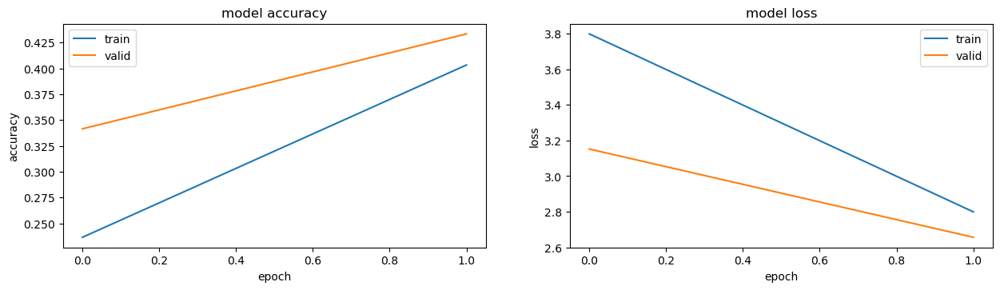

In [39]:
plot_his(history, _auto=False)

# Check that Inference Works
## Test the trained AI with one batch from the Validation set

In [40]:
print("Let's see how the model behaves on one batch of the validation set")
batch = val_ds.take(1)
one_pred = model.predict(batch)

val_count = (len(batch))
print("Have classified ", val_count, "batch of validation images, of batch size ", batch_size)


Let's see how the model behaves on one batch of the validation set
1/1 [==============================] - 1s 1s/step
Have classified  1 batch of validation images, of batch size  256


In [41]:
all_correct = []
all_incorrect = []
for images, labels in val_ds.take(1):
    print("Here is the shape of one batch of validation examples\n", images.shape)
    image_square = int(np.sqrt(batch_size)) + 1
    for i in range(batch_size):
        correct = np.argmax(labels[i])
        if correct != np.argmax(one_pred[i]):
            all_incorrect.append(images[i])
        else:
            all_correct.append(images[i])
#         ax = plt.subplot(image_square, image_square, i + 1)
#         plt.imshow(images[i].numpy().astype("uint8"), cmap='gray', aspect=(num_columns/num_rows), interpolation = 'None')
#         plt.title(class_names[correct])
#         plt.axis("off")
    
# for i, j in enumerate(all_incorrect) :
#     print(i, j)
print("Total images examined ", images.shape[0])
print("Total images correctly classified ", len(all_correct))
print("Total images incorrectly classified ", len(all_incorrect))

Here is the shape of one batch of validation examples
 (256, 32, 313, 1)
Total images examined  256
Total images correctly classified  116
Total images incorrectly classified  140


# Examine the CNN Filters
## Visualize each layer of the trained CNN
* We wish to examine the trained CNN model. In particular, we will be looking to see if we have too many (redundant) convolutional filters, or if there are other issues that can be discerened by looking into the trained CNN.
* We will do this by traversing the internal workings of the trained CNN weights.
* First we identify the Conv2D layers, and any MaxPooling layers that precede them
* NOTE: Here is where I hard-coded the layers, so if you add or remove layers, you'll need to modify the first few lines of the code below

In [42]:
###########################################################################################
# If the user changes the layers of the network, below parameters must also be changed    #
###########################################################################################
# NOTE This is manually configured. Need to make this automated.
num_conv = 7 # number of convolutional layers
conv_layer = [2, 3, 5, 7, 9, 10, 12] # the layer (counting from layer 0, the input layer) of the Conv2D's'
flatten_layer = 13
embed_layer = 14   # The first Dense layer after the Flatten
class_layer = 15   # The last Dense layer (with Softmax Activation) that determines the final classification
scale_size = [1, 1, 2, 1, 1, 2, 1] # any scaling (due to strides or max pooling) that took place just prior to or at that conv layer (not cumulative)
###########################################################################################
# If the user changes the layers of the network, above parameters must also be changed    #
###########################################################################################


model_explore = [] # list of models that stop at each convolutional layer
Conv2D_weights = [] # list of filters for convolutional layer
Conv2D_biases = [] # list of filter biases for convolutional layer

for i in range (num_conv):
    conv_ind = conv_layer[i]
    print("Conv2D ", i, "occurs at layer",conv_ind)
    model_explore.append(Model(inputs=model.inputs, outputs=model.get_layer(index=conv_ind).output))
    print("Including prior layers, will get an Input Shape of:",model_explore[i].input_shape)
    print("and have an Output Shape of:",model_explore[i].output_shape )
    Conv2D_weights.append(np.copy(model.get_layer(index=conv_ind).get_weights()[0]))
    Conv2D_biases.append(np.copy(model.get_layer(index=conv_ind).get_weights()[1]))
    # These are the filters
    print("Final Conv2D has the following rows, columns, color depth, number of filters", Conv2D_weights[i].shape)
    # These are the biases
    print("and bias for each filter", Conv2D_biases[i].shape)
    print("------------------------")

model_flatten = Model(inputs=model.inputs, outputs=model.get_layer(index=flatten_layer).output)
model_embed = Model(inputs=model.inputs, outputs=model.get_layer(index=embed_layer).output)
model_class = Model(inputs=model.inputs, outputs=model.get_layer(index=class_layer).output)

Conv2D  0 occurs at layer 2
Including prior layers, will get an Input Shape of: (None, 32, 313, 1)
and have an Output Shape of: (None, 32, 313, 16)
Final Conv2D has the following rows, columns, color depth, number of filters (3, 3, 1, 16)
and bias for each filter (16,)
------------------------
Conv2D  1 occurs at layer 3
Including prior layers, will get an Input Shape of: (None, 32, 313, 1)
and have an Output Shape of: (None, 32, 313, 16)
Final Conv2D has the following rows, columns, color depth, number of filters (3, 3, 16, 16)
and bias for each filter (16,)
------------------------
Conv2D  2 occurs at layer 5
Including prior layers, will get an Input Shape of: (None, 32, 313, 1)
and have an Output Shape of: (None, 16, 156, 32)
Final Conv2D has the following rows, columns, color depth, number of filters (5, 5, 16, 32)
and bias for each filter (32,)
------------------------
Conv2D  3 occurs at layer 7
Including prior layers, will get an Input Shape of: (None, 32, 313, 1)
and have an Ou

## Create multiple sub-CNN networks
* Each network will be identical to the original trained network, except the output layer will be one of the Conv2D layers
* We want to input an image (in this case, features extracted from audio bird calls, transformed into an 8 bit resolution grayscale image) and output the results of that last Conv2D layer.
* From this intermediate output, we will work backwards through the CNN and attempt to recreate the original image (later in this notebook).
* We will also use these sub-networks to visualize the CNN filters as described above.

In [43]:
# PANv12f now we use a list of models that can be traversed.
for conv_l in range(num_conv):
    print("Overall Explore ",conv_l," Model Summary:", model_explore[conv_l].summary(), "\n")

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 313, 1)]      0         
                                                                 
 rescaling (Rescaling)       (None, 32, 313, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 32, 313, 16)       160       
                                                                 
Total params: 160
Trainable params: 160
Non-trainable params: 0
_________________________________________________________________
Overall Explore  0  Model Summary: None 

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 313, 1)]      0         
                                                                 
 r

## Let's observe the internal models of the CNN visually
* Each convolution filter has weights that form the pattern "it is looking for." 
* More specifically, image areas that most closely match the weights of the convolutional filter will yield a higher numerical value when convolved (multiplied) by that filter.
* When MaxPooling, it is these most closely matching parts of the image that will have maximal values, and therefore remain, while other, less closely matching portions of the image will be thrown away since they will vield lower convolution values.
* In this way we can visualize the types of image pixel groupings each CNN filter "is looking for."
* When multiple CNN layers are connected in sequence, the last layer receives a CNN value from multiple filters in the prior layer. Here too, the last CNN layer is "looking for" combinations of prior layer CNN filter convolution results. We can literally combine those prior CNN layer visualizations to form a visualization for each of the last CNN layer filters.
* In this way, we build up visualizations of what each filter of each CNN layer "is looking for." 
* Layers like Droput are ignored in this analysis
* Layers like MaxPooling are handled with a scaling factor
### NOTE: Similar to the "expansion" method shown here https://distill.pub/2020/circuits/visualizing-weights/

Show the reconstructed image patch for each filter of convolutional layer  0 which occured at layer  2 in the original model
Conv Layer 0  filter Size: 3  x  3  and border size (padding) of  1  and cumulative border from prior layers of  0


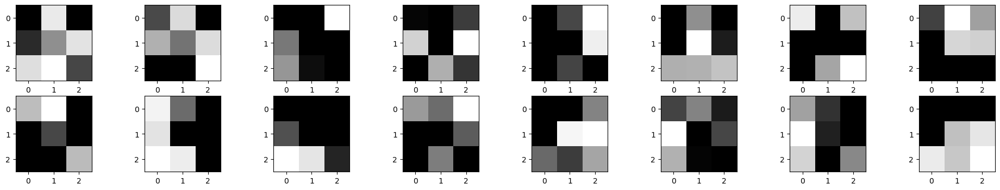

Show the reconstructed image patch for each filter of convolutional layer  1 which occured at layer  3 in the original model
Conv Layer 1  filter Size: 3  x  3  and border size (padding) of  1  and cumulative border from prior layers of  1


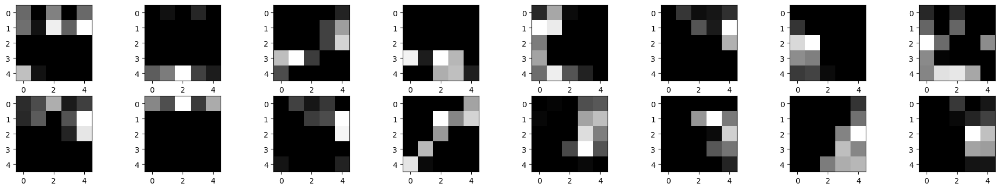

Show the reconstructed image patch for each filter of convolutional layer  2 which occured at layer  5 in the original model
Conv Layer 2  filter Size: 5  x  5  and border size (padding) of  2  and cumulative border from prior layers of  2


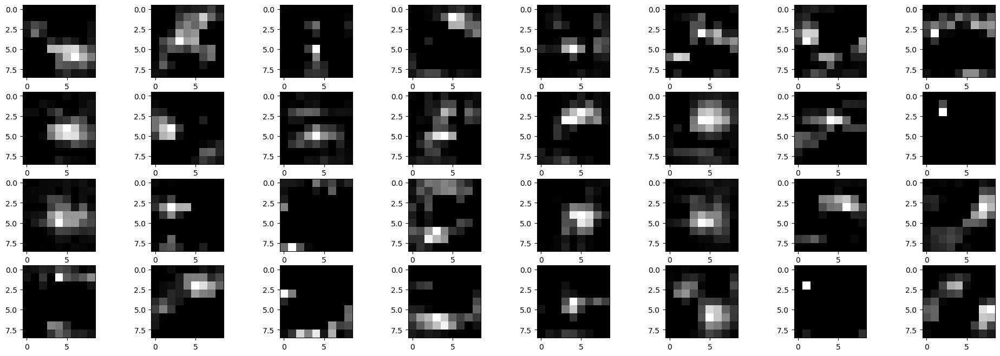

Show the reconstructed image patch for each filter of convolutional layer  3 which occured at layer  7 in the original model
Conv Layer 3  filter Size: 3  x  3  and border size (padding) of  1  and cumulative border from prior layers of  4


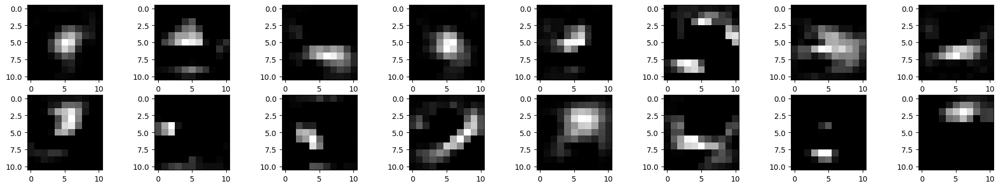

Show the reconstructed image patch for each filter of convolutional layer  4 which occured at layer  9 in the original model
Conv Layer 4  filter Size: 3  x  3  and border size (padding) of  1  and cumulative border from prior layers of  5


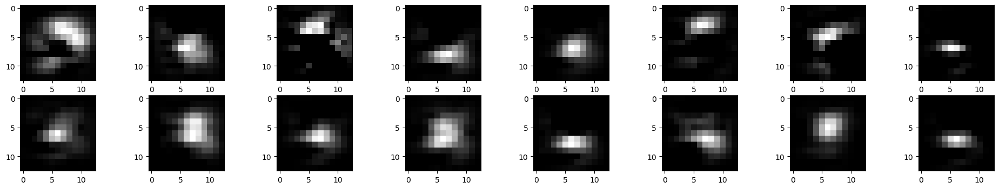

Show the reconstructed image patch for each filter of convolutional layer  5 which occured at layer  10 in the original model
Conv Layer 5  filter Size: 3  x  3  and border size (padding) of  1  and cumulative border from prior layers of  6


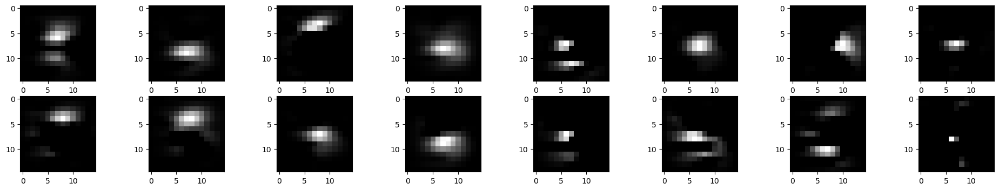

Show the reconstructed image patch for each filter of convolutional layer  6 which occured at layer  12 in the original model
Conv Layer 6  filter Size: 5  x  5  and border size (padding) of  2  and cumulative border from prior layers of  7


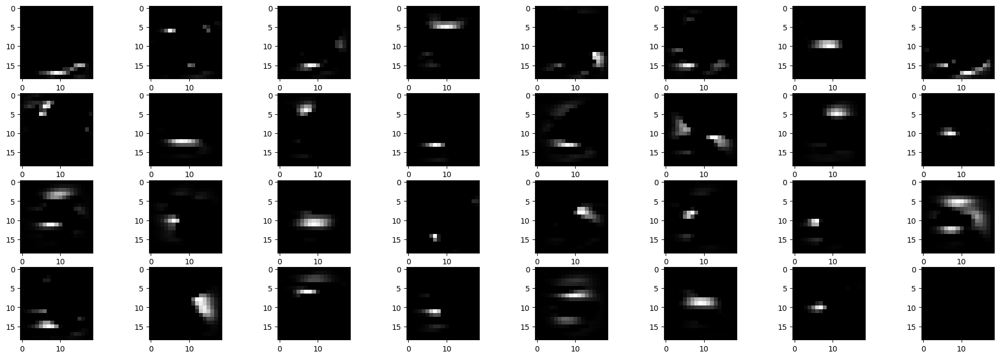

In [44]:
# a list of filter patches, one for each convolutional layer
num_filt = []            # number of filters in each Conv2D layer
filt_siz = []            # the size of each filter (assume they are square for now)
border_siz = []          # the size of the border around the center pixel of the square (assume filters are odd numbered dimensions like 3, 5, 7, etc.)
cumulative_border = []   # The cumulative effect of the borders from prior Conv3D layers
filter_patches = []      # The "mind reading" visualization of each filter - equal to the filter at the first Conv2D layer, but more complex later

for i in range (num_conv):
    conv_ind = conv_layer[i]
    print("Show the reconstructed image patch for each filter of convolutional layer ", i, "which occured at layer ",conv_ind, "in the original model")
    num_filt.append(Conv2D_weights[i].shape[3])
    # filter Size
    filt_siz.append(Conv2D_weights[i].shape[0])
    # Border size
    border_siz.append(int(filt_siz[i] / 2))
    cb = 0
    if i == 0 : 
        cumulative_border.append(0)
    else:
        for j in range(i) :
            cb += border_siz[j]
        cumulative_border.append(cb)
    print("Conv Layer", i, " filter Size:", filt_siz[i], " x ", filt_siz[i], 
          " and border size (padding) of ", border_siz[i], " and cumulative border from prior layers of ", cumulative_border[i])
    filter_patches.append(np.zeros((filt_siz[i] + 2 * cumulative_border[i], 
                                    filt_siz[i] + 2 * cumulative_border[i], 
                                    num_filt[i])))

    # For now, draw eight filters on a row for display purposes
    this_num_filt = num_filt[i]
    if (this_num_filt % 8 == 0) :
        drows = int(this_num_filt/8)
    else :
        drows = int(this_num_filt/8) + 1
    dcols = 8
    width = 24
    height = int(this_num_filt / 4)
    fig, ax = plt.subplots(nrows=drows, ncols=dcols, figsize=(width, height))
    
    thisrow = 0
    thiscol = 0
    # temporary variables for filter size and cumulative border size
    cb = cumulative_border[i]
    siz = filt_siz[i]
    image_patch = np.zeros((siz + 2 * cb, siz + 2 * cb))
    for this_filter in range(this_num_filt) :
        if i == 0 :
            image_patch = np.copy(Conv2D_weights[i][:, :, 0, this_filter])
        else:
            image_patch.fill(0)
            for x in range(cb, siz + cb, 1) :
                for y in range(cb, siz + cb, 1) :
                    for depth in range(num_filt[i-1]) :
                        image_patch[x-cb:x+cb+1, y-cb:y+cb+1] += np.copy((Conv2D_weights[i][x-cb, y-cb, depth, this_filter] * 
                                                                         filter_patches[i-1][:,:,depth]))
    
        filter_patches[i][:, :, this_filter] = np.copy(np.clip(image_patch, 0, 1e999)) # remove negative numbers (due to "relu" activation we used)
        
        # display the filter 
        if (drows > 1) :
            ax[thisrow, thiscol].imshow(filter_patches[i][:, :, this_filter], cmap="gray")
        else :
            ax[thiscol].imshow(filter_patches[i][:, :, this_filter], cmap="gray")
        thiscol += 1
        if (thiscol >=8) :
            thisrow += 1
            thiscol = 0
    
    plt.show()

## The above shows the filters of each Conv2D layer, multiplied by prior filters, to create a cumilative pattern being targeted by each successive layer (top to bottom)

## What can we learn from the above?
* We can see that successive convolution layers manage succesive levels of complexity. These are often described as edge detection first, then these are combined to form textures. Finally, the last convolution layer combines these textures to form patterns it is looking for in order to correctly identify birds. 
* Do we have too many convolutional layers in the middle? Examining the filters, are all the middle layers "adding value?"
* Looking at the last layer (the last group of images) we can see patterns the CNN is looking for. Specifically, look for the white areas and dark areas, and see if the white area is sloped upwards (the bird is going from a high frequency to a low frequency) or downwards (bird goes from low frequency to high frequency, otherwise known as a "chirp").
* Notice also that the specific frequency (musical notes) that the bird is singing is NOT shown at the convolution layer, just the pattern, which might be found at low frequencies or high ones. We would need to reconstruct the signal from the convolutional layer (work backwards through the network) to be able to discern what frequency / time does the pattern occur.


# Observe Data As It Moves Through Each Layer
## Work backwards through the network to recreate the sounds and original input.
* We'll just look at the first dozen (12) birds sounds in our batch. 
* For each one, we'll show the original input to the left, and successive recreations of that original input, from left to right - all the way to the last Conv2D layer.
* Finally, for one of the examples (the last one below) we will take the recreated input (feature vectors) and make a best approximation of the input audio - so the user can hear how much information remains as the NN process the data through each layer.

In [45]:
for image in train_ds.take(1) :
    X_correct = image[0][0:11]

# Now create the output from up to different convolutional layers (using out "explore" models)
print("First examine twelve training examples")
pred_explore = []
for i in range (num_conv):
    pred_explore.append(model_explore[i].predict(X_correct))
    print("Have processed images through convolutional layer" ,i, "of the neural network. Output shape is", pred_explore[i].shape)

# Let's also look at the outputs of successive Dense layers
pred_flatten = model_flatten.predict(X_correct)
print("Have processed images through to the Flatten layer of the neural network. Output shape is", pred_flatten.shape)
# This is processing the input all the way throug to the first Dense layer after the Flatten (I'll call this the Embedding layer, since it maps all of the input to an n-dimansional vector)
pred_embed = model_embed.predict(X_correct)
print("Have processed images through to the embedding (first Dense) layer of the neural network. Output shape is", pred_embed.shape)
# This is processing the input all the way throug to the last Dense layer (with the Softmax activation) that picks the final classification
pred_class = model_class.predict(X_correct)
print("Have processed images through to the classification (last Dense with Softmax) layer of the neural network. Output shape is", pred_class.shape)


First examine twelve training examples
1/1 [==============================] - 0s 80ms/step
Have processed images through convolutional layer 0 of the neural network. Output shape is (11, 32, 313, 16)
1/1 [==============================] - 0s 90ms/step
Have processed images through convolutional layer 1 of the neural network. Output shape is (11, 32, 313, 16)
1/1 [==============================] - 0s 103ms/step
Have processed images through convolutional layer 2 of the neural network. Output shape is (11, 16, 156, 32)
1/1 [==============================] - 0s 110ms/step
Have processed images through convolutional layer 3 of the neural network. Output shape is (11, 16, 156, 16)
1/1 [==============================] - 0s 125ms/step
Have processed images through convolutional layer 4 of the neural network. Output shape is (11, 16, 156, 16)
1/1 [==============================] - 0s 134ms/step
Have processed images through convolutional layer 5 of the neural network. Output shape is (11, 16, 


 original image on the left followed by successive convolution layer recreations 



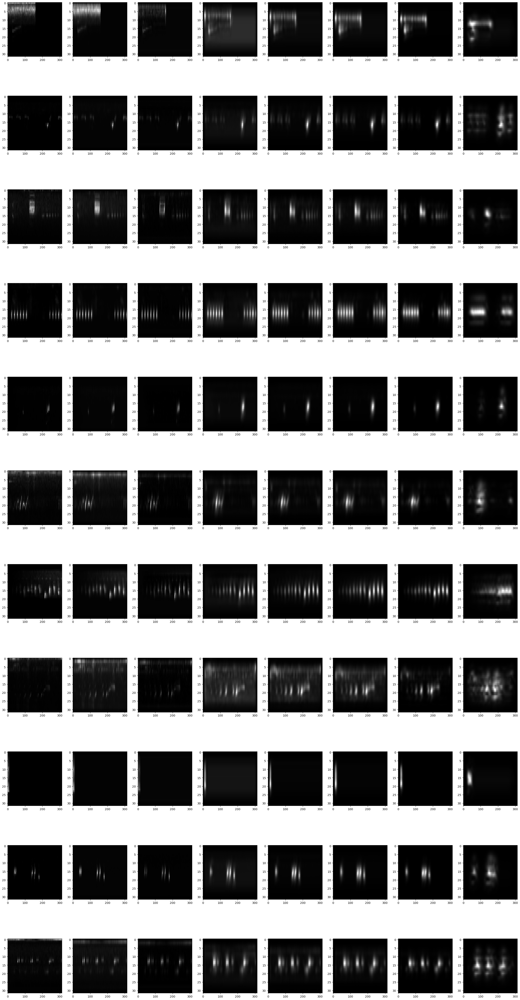

In [46]:
X_test = X_correct
# In this section we reverse the convolution layer to recreate a picture
num_img = X_test.shape[0]

# display the original and re-created images
fig, ax = plt.subplots(nrows=num_img, ncols=num_conv+1, figsize=(32, 64))

print("\n original image on the left followed by successive convolution layer recreations \n")

for i in range(num_img) : # 
    last_scratch = []
    col = 0
    # original image
    ax[i,col].imshow(X_test[i,:,:,0], cmap="gray", aspect=(num_columns/num_rows))
    last_scratch.append(X_test[i,:,:,:])
    col += 1
    for j in range(num_conv) :
        patch_h = pred_explore[j].shape[1]
        patch_w = pred_explore[j].shape[2]
        # Recreate image from combination of this and all of the prior layers of filters, multiplied by the output of this layer
        tot_border = int((cumulative_border[j] + border_siz[j]))
        scratch = np.zeros((patch_h + 2 * tot_border,patch_w + 2 * tot_border)) # The size of output plus borders
        for x in range(tot_border, patch_h+tot_border, 1) :
            for y in range(tot_border, patch_w+tot_border, 1) :
                for this_filter in range(num_filt[j]) :
                    # Find the color patch attributable to this Filter multiplied by the output value it generated
                    this_color_patch = np.copy(filter_patches[j][:,:,this_filter])
                    this_color_patch *= (pred_explore[j][i,x-tot_border,y-tot_border,this_filter])               
                    scratch[x-tot_border:x+tot_border+1, y-tot_border:y+tot_border+1] += np.copy(this_color_patch)
        PIL_image = Image.fromarray(scratch)
        scratch = np.array(PIL_image.resize([num_columns, num_rows]))
        size_h = scratch.shape[0]
        size_w = scratch.shape[1]
        last_scratch.append(scratch) # keep a copy of the recreated features for the last image for further analysis
        ax[i,col].imshow(scratch, cmap="gray", aspect=(num_columns/num_rows))   # here is if we want to show the full reconstruction
        col += 1


plt.show()


## The above shows 12 different bird sounds (rows) moving through the AI layers (left column is input, remaining columns are successive Conv2D layers)

## Let's look at the above:
* We can see that some sort of distinguishing features are carried forwards from the input image (left) through each convolution layer. 
* The last convolution layer (right column) seems the most distorted (fewer visual distinguishing features), and it is indeed the layer before Flatten and Dense.
* In addition to visual examination of these inner workings of the NN, we can also reverse transform the signal and let a human expert see if the audio still allows correct classification of the bird

Let's do that for the bird in last row above.

## Below, we see and hear each layer of that last row
* Using that last bird sound (the last row of the above) we will show the recreated input signal, that input signal converted to audio, and both the audio graph and audio playback.
* We'll look for how much information is retained by the network, in a way that a human expert can tell if sufficient information remains to tell one bird from another.

# Recreate Input from Data at Every Layer
## Listen to an approximation of the original input based on output from each layer
* As you scroll through the below, see and hear how much information remains within each successive layer
* In particular, can an expert use that information to classify the bird?

Original input file.

Shape of image array:  (32, 313) , visualization and audio playback



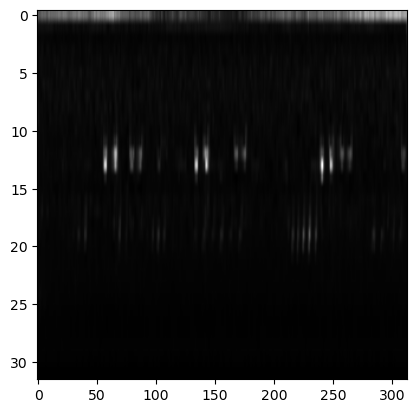

In [47]:
# Convert the transformed data back into an audio file
this_layer = 0
print("Original input file.\n")
norm_trans = np.array(last_scratch[this_layer][:,:,0]) # remove the color dimension (all grayscale)
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))


After scaling, normalized transform has values within this range:  0.0 255.0
This is the recreated audio, (un-transformed) visually displayed as a graphic file


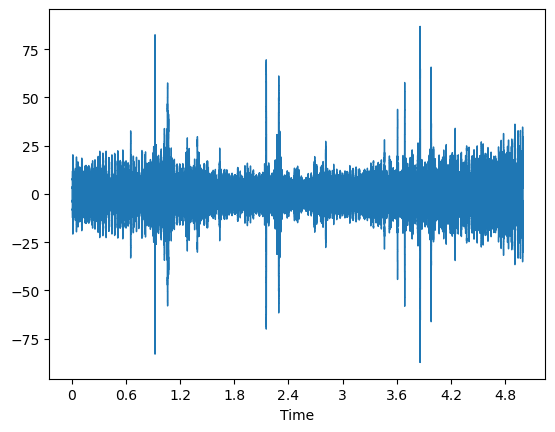

In [48]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [49]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  1  

Shape of image array:  (32, 313) , visualization and audio playback



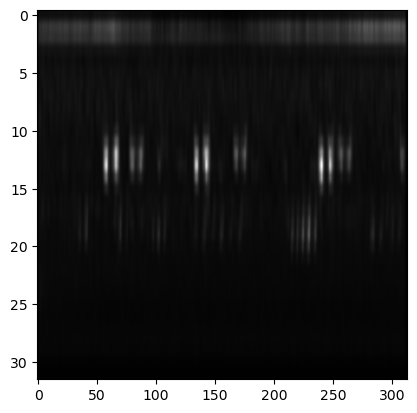

In [50]:
# Convert the transformed data back into an audio file
this_layer = 1
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  0.0046584597 2.6224618
This is the recreated audio, (un-transformed) visually displayed as a graphic file


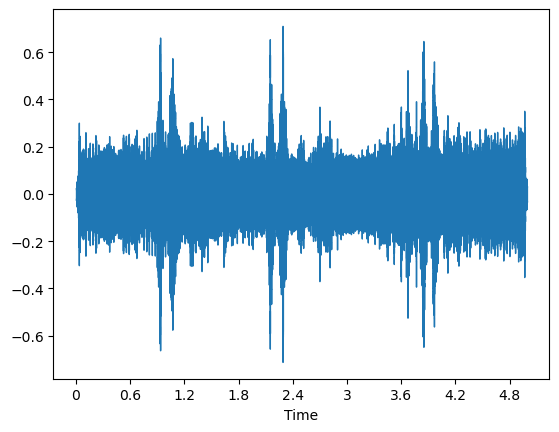

In [51]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [52]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  2  

Shape of image array:  (32, 313) , visualization and audio playback



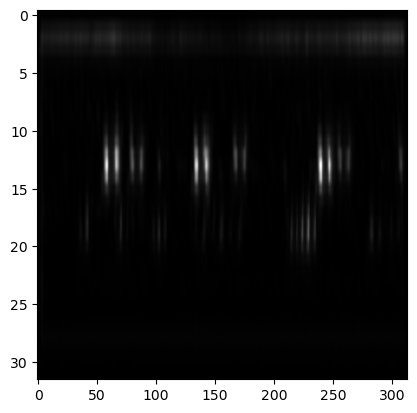

In [53]:
# Convert the transformed data back into an audio file
this_layer = 2
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  -7.2811694e-05 1.6187782
This is the recreated audio, (un-transformed) visually displayed as a graphic file


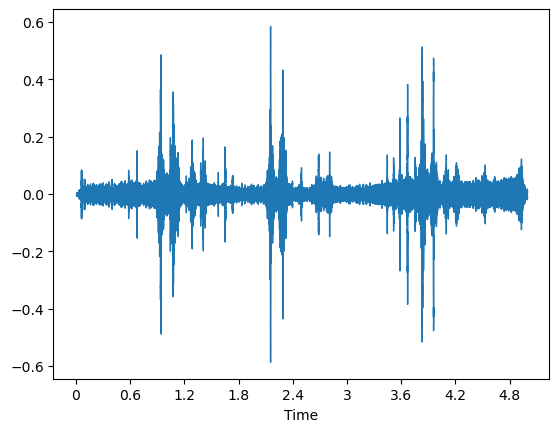

In [54]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [55]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  3  

Shape of image array:  (32, 313) , visualization and audio playback



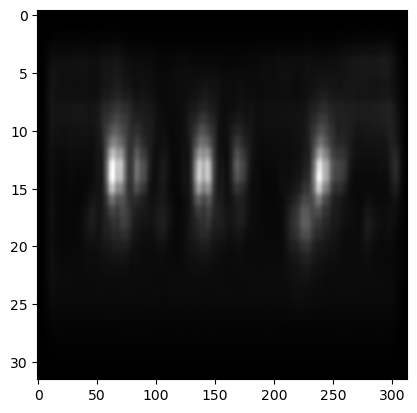

In [56]:
# Convert the transformed data back into an audio file
this_layer = 3
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  0.00028200969 5.276518
This is the recreated audio, (un-transformed) visually displayed as a graphic file


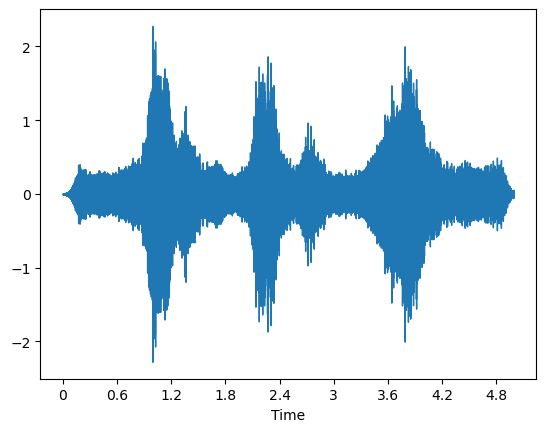

In [57]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [58]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  4  

Shape of image array:  (32, 313) , visualization and audio playback



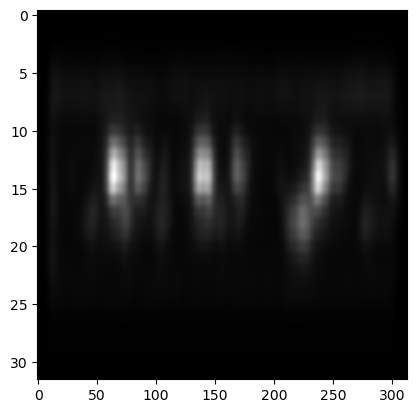

In [59]:
# Convert the transformed data back into an audio file
this_layer = 4
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  1.4954084e-05 13.165554
This is the recreated audio, (un-transformed) visually displayed as a graphic file


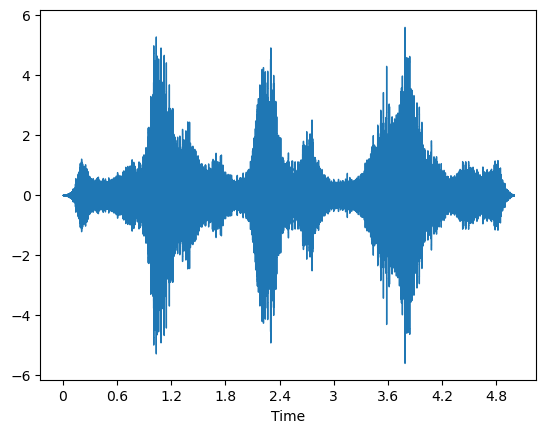

In [60]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [61]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  5  

Shape of image array:  (32, 313) , visualization and audio playback



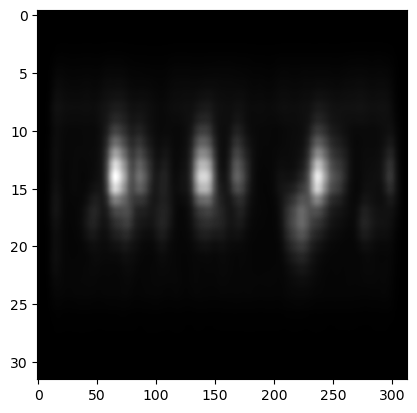

In [62]:
# Convert the transformed data back into an audio file
this_layer = 5
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  2.9247523e-05 81.886406
This is the recreated audio, (un-transformed) visually displayed as a graphic file


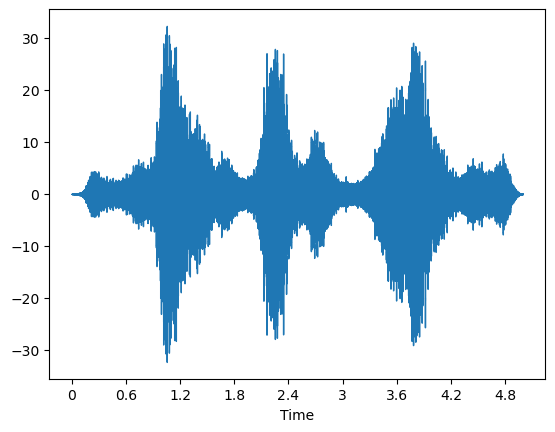

In [63]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [64]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  6  

Shape of image array:  (32, 313) , visualization and audio playback



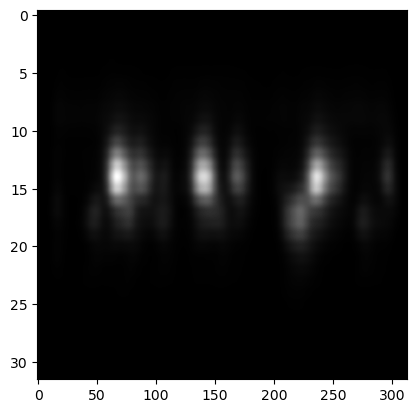

In [65]:
# Convert the transformed data back into an audio file
this_layer = 6
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  -3.2581615e-05 205.60037
This is the recreated audio, (un-transformed) visually displayed as a graphic file


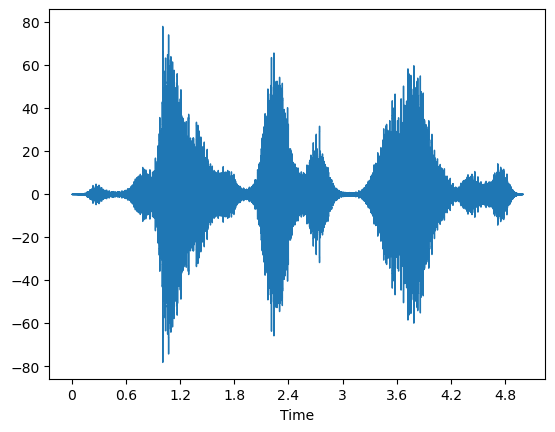

In [66]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [67]:
IPython.display.Audio(data = untrans_1, rate=sr)

Recreated input signal from output of CNN layer,  7  

Shape of image array:  (32, 313) , visualization and audio playback



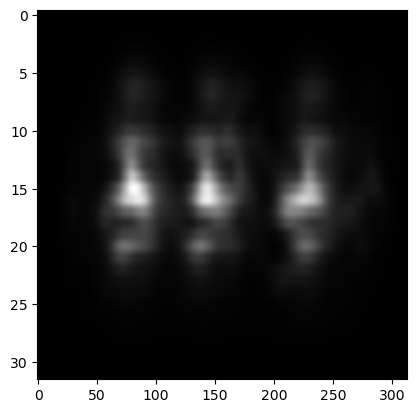

In [68]:
# Convert the transformed data back into an audio file
this_layer = 7
print("Recreated input signal from output of CNN layer, ", this_layer, " \n")
norm_trans = np.array(last_scratch[this_layer])
print("Shape of image array: ", norm_trans.shape, ", visualization and audio playback\n")
plt.imshow(norm_trans, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  -2.7013377e-07 58.15904
This is the recreated audio, (un-transformed) visually displayed as a graphic file


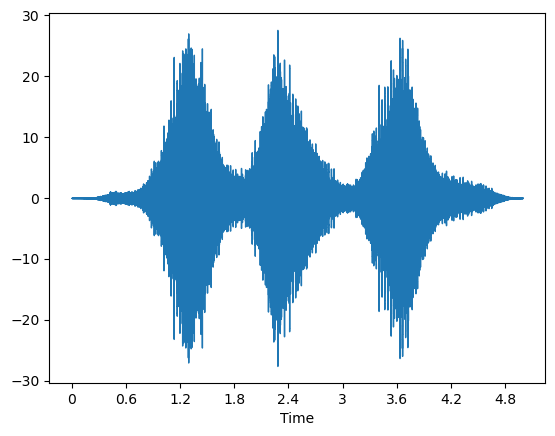

In [69]:
print("After scaling, normalized transform has values within this range: ", norm_trans.min(), norm_trans.max())
untrans_1 = Domain_to_Audio(norm_trans, sr)
print("This is the recreated audio, (un-transformed) visually displayed as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)

In [70]:
IPython.display.Audio(data = untrans_1, rate=sr)

## NOTE: Best estimate recreations of input can be flawed
Just because we recreated the original input, doesn't mean our recreation is recognizable by the NN

In [71]:
y_this = model.predict(np.reshape(norm_trans, (1, num_rows, num_columns, 1)))
norm_trans2 = np.array(last_scratch[0][:,:,0]) # remove the color dimension (all grayscale)
y_original = model.predict(np.reshape(norm_trans2, (1, num_rows, num_columns, 1)))

print("The above 'recreated input' is not necessarily recognizable by the network as a correct solution.\n", 
      "In this particular case, the reconstructed input above was categorized as bird number ", y_this.argmax(), "\n",
      "and the original input was categorized as bird number ", y_original.argmax(), ". \n")

1/1 [==============================] - 0s 30ms/step
The above 'recreated input' is not necessarily recognizable by the network as a correct solution.
 In this particular case, the reconstructed input above was categorized as bird number  72 
 and the original input was categorized as bird number  89 . 



## What can we observe from the above?
* We can see that with each successive convolutioanl layer, the network is narrowing down to the features that help to distiguish one bird from another - even if it doesn't perfectly the original signal.
* We can also see the biggest leaps in "loss" (when recreating the original signal) take place right after the MaxPool layers
* Finally, we see that there is a loss of "time" information at the last convolutional layer, because after that we flatten the data (row-by-row concatenation) we are blending together the vertical frequency information and the horizontal time information. When we recreate the audio, it sounds like a mish-mash of the sounds the birds make, but not necessarily the cadence / sequence / timing of those sounds.

### Is this a problem?
* It's really up to you to make that decision. 
* Remember, this is not a human child that has listened to millions of sounds before someone teaches them that "this is the sound of this type of bird." The network was only trained on the sounds of birds, and therefore doesn't know what a human expert knows (such as how to classsify many many other non-bird sounds as well). It may make sense for this "single use classifier" to ignore the items mentioned above.
* Just looking at a blob of "this bird's sounds" while ignoring the time sequencing may be an issue if, for example, there are two different birds that use the same musical notes, but in a different pattern broken up by silence over time

# Examine the Final Dense Layers
* Let's examine what information is provided at the embed layer (the first Dense layer after the Flatten)
* Let's also examine what information is provided at the classification layer (the last Dense layer with Softmax activation).
* Here, as before, we are looking at a single bird sound (that we examined in detail above)

In [72]:
#######################################################################################################################
# If changing the shape of the last convolutional later or embed layer, please also change this next lines            #
# Sorry this is hard coded. Need to make it autoconfigured.                                                           #
#######################################################################################################################
pre_flatten = (8, 78, 32, 64)   
into_flatten = (8, 78, 32)

### First see that we can undo the "Flatten" layer without loss

First we see that we can undo the Flatten layer
The input to the Embed layer (the first Dense layer after Flatten) gets the following flattened input shape:  (19968,)
Un flattened layer shape is  (8, 78, 32)

Indeed, the flatten layer does not change the best approximation of the input for this bird, given the contents of the last Conv2D layer (flattend and then un-flattened).



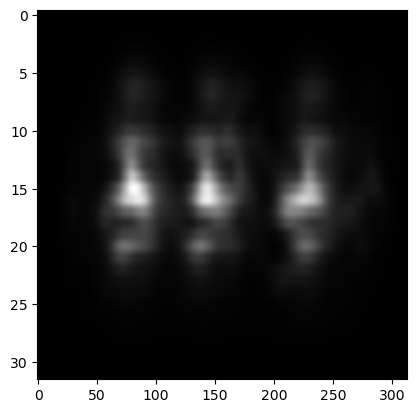

In [73]:
print("First we see that we can undo the Flatten layer")
last_flatten = pred_flatten[num_img - 1]
print("The input to the Embed layer (the first Dense layer after Flatten) gets the following flattened input shape: ", last_flatten.shape)
un_flattened = np.reshape(last_flatten, into_flatten)
print("Un flattened layer shape is ", un_flattened.shape)

# The last convolutional network  is a 3 dimensional array of dimensions rows x columns x filters
num_conv_rows = un_flattened.shape[0]
num_conv_cols = un_flattened.shape[1]
num_conv_filt = un_flattened.shape[2]

# As we build visualizations of each Convolutioal Layer, we cumulatively created "filter patches" that 
# represent all of the prior Convolutional layers as well. Because of this, we don't need to 
# recalculate each layer backwards. We can just use the forward calculated final convolutional layer
# filter patch
last_conv_layer = num_conv - 1
last_filter_patches = filter_patches[last_conv_layer]

# We will use the values of the embed layer (called embed_data here) multiplied by all
# the corresponding weights that connected the last convolutional layer to that embed
# layer (we took care of the "Flatten" above), and those values are the multiplier
# we will apply to each filter patch at the respective location of the recreation.
# In this way, we are moving backwards through the NN; from embed, to last Convolutional
# layer, and finally all the way to a best approximation of the input.
# NOTE: Since we used padding in the forward pass, we'll need to add a border to 
# our workspace input recreation
border = int(last_filter_patches.shape[0]/2) 
extra_pixels = 2 * border 

# Create the workspace where individual filter patchess will be weighted and added up
conv_data1 = np.zeros((num_conv_rows + extra_pixels, num_conv_cols + extra_pixels))
# add 'em up
for j in range(num_conv_filt):
    this_filter_patch = last_filter_patches[:,:,j]
    for k in range(border, num_conv_cols + border, 1):
        for l in range(border, num_conv_rows + border, 1):
            conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * un_flattened[l-border, k-border, j]
                
conv_data2 = np.copy(conv_data1) 
PIL_image = Image.fromarray(conv_data2)
conv_data = np.array(PIL_image.resize([num_columns, num_rows]))

print("\nIndeed, the flatten layer does not change the best approximation of the input for this bird, given the contents of the last Conv2D layer (flattend and then un-flattened).\n")
plt.imshow(conv_data, cmap="gray", aspect=(num_columns/num_rows))


### Now lets see the loss of the Embed layer
The embed layer (the first Dense layer after the Flatten) has much fewer neurons (output values) than the prrior Conv2D layer, and so we would expect that data is lost. Let's examine it visually and audibly.
### Still examining that bird above, where input was passed through each layer

Output of the Embed layer (first Dense layer after Flatten)


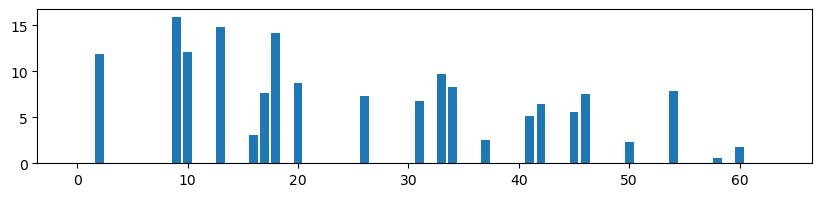

In [74]:
last_embed = pred_embed[num_img - 1]

# Creating bar chart of Embed layer output values
x = np.arange(64)
fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, np.array(last_embed))

print("Output of the Embed layer (first Dense layer after Flatten)")
# Show plot
plt.show()

Weights array from the last Conv2D layer to the Embed layer has the shape  (19968, 64)
Weights array shape to the embed layer after undoing the Flatten  (8, 78, 32, 64)
Here is the best approximation of the input for this bird



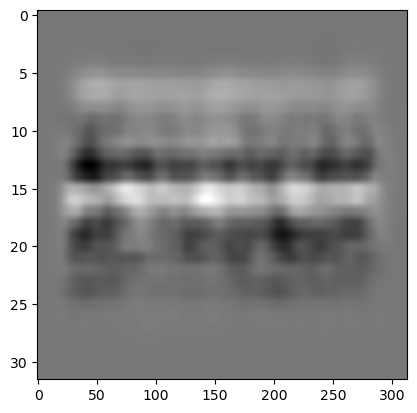

In [75]:
# Let's calculate the last Conv2D layer for this forced classification
# Weights from the last Conv2D layer to the flatten->embed layer
last_conv_weights_flat = np.copy(model.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the last Conv2D layer to the Embed layer has the shape ", last_conv_weights_flat.shape)

last_conv_weights = np.copy(np.reshape(last_conv_weights_flat, pre_flatten))
print("Weights array shape to the embed layer after undoing the Flatten ", last_conv_weights.shape)

# The last convolutional network  is a 3 dimensional arrax of dimensions rows x columns x filters
num_conv_rows = last_conv_weights.shape[0]
num_conv_cols = last_conv_weights.shape[1]
num_conv_filt = last_conv_weights.shape[2]
# In addition, each of these rows x columns x filter outputs is connected to a dense layer with a number of neurons (called the embed layer)
num_embed_neurons = last_conv_weights.shape[3]

# As we build visualizations of each Convolutioal Layer, we cumulatively created "filter patches" that 
# represent all of the prior Convolutional layers as well. Because of this, we don't need to 
# recalculate each layer backwards. We can just use the forward calculated final convolutional layer
# filter patch
last_conv_layer = num_conv - 1
last_filter_patches = filter_patches[last_conv_layer]

# We will use the values of the embed layer multiplied by all
# the corresponding weights that connected the last convolutional layer to that embed
# layer (we took care of the "Flatten" above), and those values are the multiplier
# we will apply to each filter patch at the respective location of the recreation.
# In this way, we are moving backwards through the NN; from embed, to last Convolutional
# layer, and finally all the way to a best approximation of the input.
# NOTE: Since we used padding in the forward pass, we'll need to add a border to 
# our workspace input recreation
border = int(last_filter_patches.shape[0]/2) 
extra_pixels = 2 * border 

# Create the workspace where individual filter patchess will be weighted and added up
conv_data1 = np.zeros((num_conv_rows + extra_pixels, num_conv_cols + extra_pixels))
# add 'em up
for i in range(num_embed_neurons):
    embed_value = last_embed[i] # using local variables to speed things up
    for j in range(num_conv_filt):
        this_filter_patch = last_filter_patches[:,:,j]
        this_conv_to_embed_weights = last_conv_weights[:,:,j,i]
        for k in range(border, num_conv_cols + border, 1):
            for l in range(border, num_conv_rows + border, 1):
                conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * this_conv_to_embed_weights[l-border,k-border] * embed_value
                
for j in range(num_conv_filt):
    this_filter_patch = last_filter_patches[:,:,j]
    for k in range(border, num_conv_cols + border, 1):
        for l in range(border, num_conv_rows + border, 1):
            conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * un_flattened[l-border, k-border, j]
            
            
conv_data2 = np.copy(conv_data1) 
PIL_image = Image.fromarray(conv_data2)
conv_data = np.array(PIL_image.resize([num_columns, num_rows]))

print("Here is the best approximation of the input for this bird\n")
plt.imshow(conv_data, cmap="gray", aspect=(num_columns/num_rows))

After scaling, normalized transform has values within this range:  -184.00009 208.82405
This is the recreated audio, (un-transformed) hear and see as a graphic file


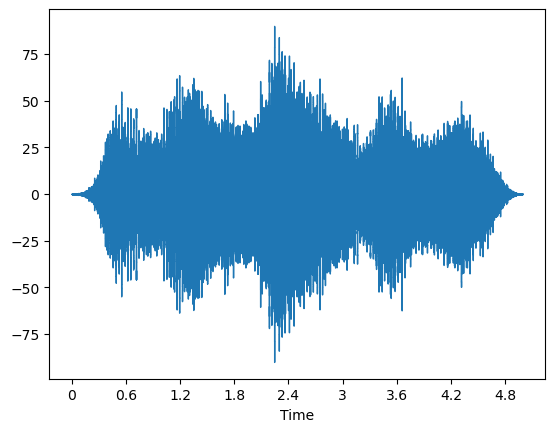

In [76]:
print("After scaling, normalized transform has values within this range: ", conv_data.min(), conv_data.max())
untrans_1 = Domain_to_Audio(conv_data, sr)
print("This is the recreated audio, (un-transformed) hear and see as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)
IPython.display.Audio(data = untrans_1, rate=sr)

## What can we observe from the above?
* The first Dense layer (I call it the Embed layer, since it comes just before the Classification layer) seems to be trowing away a great deal of useful information.
* This is to be expected, because prior to this layer, there were many more numerical values (neuron ouputs) representing the signal, but now this has been reduced down to our embedding dimension.
* Can you still see and hear distinguishing charactersitics sich as main pitch, rising or lowering pitch over time, etc.?

Output of the Classification layer (last Dense layer using Softmax)


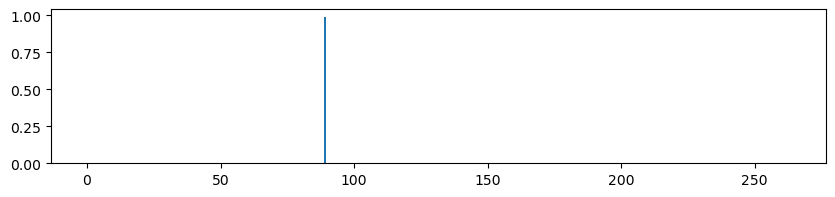

In [77]:
last_class = pred_class[num_img - 1]

# Creating bar chart of Classification layer output values
x = np.arange(num_birds)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, np.array(last_class))

print("Output of the Classification layer (last Dense layer using Softmax)")
# Show plot
plt.show()

# What Does Bird "X" Sound Like?
## What if we don't have an input signal, and just work backwards from a classification?
* We will repeat this for the first few birds, to see what the "Robot Mind" thinks that particular bird sounds like


## Starting with bird class 0 - "abethr1"
* We'll hear what an example original audio sounds like, and see the input features associated with it
* After that, we'll work backwards through the NN to approximate an input feature set (image) and from that audio best approximation
* Finally, we'll listen to what the NN has learned each bird "sounds like" - you may be surprised!

### Listen to an example of what that bird sounds like

Here is an example of original audio of this  African Bare-eyed Thrush  bird sounds like

This is the audio playback of the ORIGINAL audio file


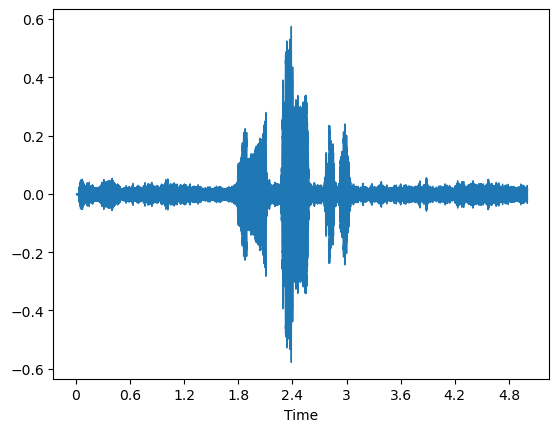

In [78]:
bird_class = 0
example_audio_index = 0
audio_filename = image_data.at[0,"filename"]
common_name = image_data.at[0,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]

print("Here is an example of original audio of this ", common_name, " bird sounds like\n")
librosa.display.waveshow(audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

### For the above example, show the extracted features

These are teh features that will be used as input for the above example audio.



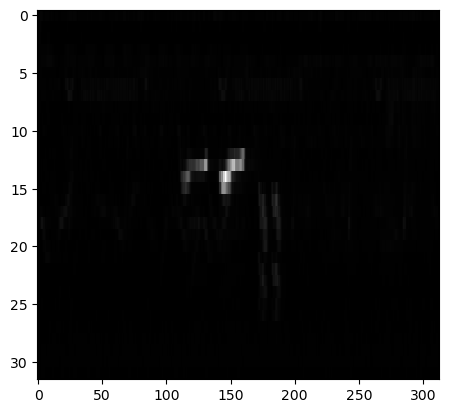

In [79]:
# These are the features for the above audio sample
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
print("These are teh features that will be used as input for the above example audio.\n")
plt.imshow(feat, cmap='gray', aspect=int(num_columns/num_rows) , interpolation = 'None')
plt.show() 

### Force the output category of the NN to be the above bird

Here is the forced output of our classification layer (the last Dense layer with Softmax activation)


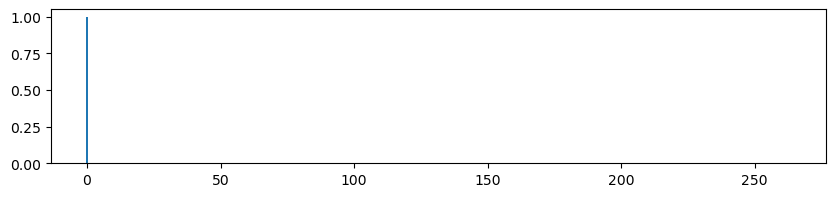

In [80]:
# Let's see if we can work backwards from a classification - in this case, we'll use the frst bird
bird_class = 0 # You can pick a different bird here if you wish
force_class = np.zeros(num_birds)
force_class[bird_class] = 1

print("Here is the forced output of our classification layer (the last Dense layer with Softmax activation)")
# Creating bar chart of Embed layer output values
x = np.arange(num_birds)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, force_class)

# Show plot
plt.show()

Weights array from the embed layer to the class layer has the shape  (64, 264)
Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)


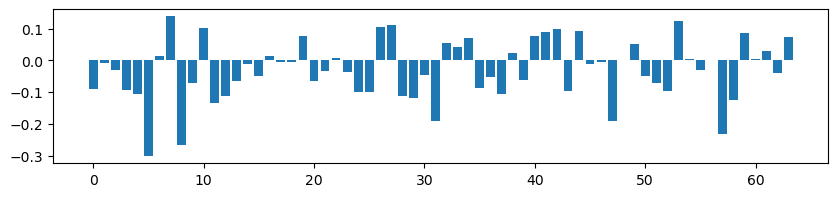

Weights array from the flattened last Conv layer to the embed has the shape  (19968, 64)


In [81]:
# Let's calculate the Embed layer for this forced classification
# Weights from the embed layer to the Classification layer
class_weights = np.copy(model_class.get_layer(index=class_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", class_weights.shape)

num_embed_neurons = class_weights.shape[0]
num_class_neurons = class_weights.shape[1]
embed_data = np.zeros(num_embed_neurons)
for i in range(num_embed_neurons):
    for j in range(num_class_neurons):
        embed_data[i] += force_class[j] * class_weights[i, j]

print("Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)")

# Creating bar chart of Embed layer output values
x = np.arange(num_embed_neurons)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, embed_data)

# Show plot
plt.show()

# Weights from the embed layer to the Flatten-ed last Conv layer
embed_weights = np.copy(model_embed.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the flattened last Conv layer to the embed has the shape ", embed_weights.shape)

### Work backwards through the NN to recreate a best approximation of the input features, and audio, of the above bird.
* Essentially "What has the NN learned to be the audio feature set for the above bird, and what does it sound like?"

Weights array from the embed layer to the class layer has the shape  (19968, 64)
Weights array shape from the embed layer after undoing the Flatten  (8, 78, 32, 64)
Here is the best approximation of the input for this bird



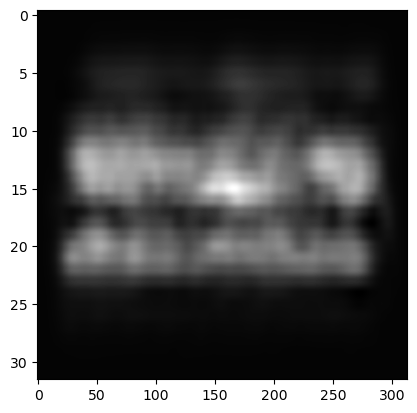

In [82]:
# Let's calculate the last Conv2D layer for this forced classification
# Weights from the last Conv2D layer to the embed layer
last_conv_weights_flat = np.copy(model.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", last_conv_weights_flat.shape)

last_conv_weights = np.copy(np.reshape(last_conv_weights_flat, pre_flatten))
print("Weights array shape from the embed layer after undoing the Flatten ", last_conv_weights.shape)

# The last convolutional network  is a 3 dimensional arrax of dimensions rows x columns x filters
num_conv_rows = last_conv_weights.shape[0]
num_conv_cols = last_conv_weights.shape[1]
num_conv_filt = last_conv_weights.shape[2]
# In addition, each of these rows x columns x filter outputs is connected to a dense layer with a number of neurons (called the embed layer)
num_embed_neurons = last_conv_weights.shape[3]

# As we build visualizations of each Convolutioal Layer, we cumulatively created "filter patches" that 
# represent all of the prior Convolutional layers as well. Because of this, we don't need to 
# recalculate each layer backwards. We can just use the forward calculated final convolutional layer
# filter patch
last_conv_layer = num_conv - 1
last_filter_patches = filter_patches[last_conv_layer]

# We will use the values of the embed layer (called embed_data here) multiplied by all
# the corresponding weights that connected the last convolutional layer to that embed
# layer (we took care of the "Flatten" above), and those values are the multiplier
# we will apply to each filter patch at the respective location of the recreation.
# In this way, we are moving backwards through the NN; from embed, to last Convolutional
# layer, and finally all the way to a best approximation of the input.
# NOTE: Since we used padding in the forward pass, we'll need to add a border to 
# our workspace input recreation
border = int(last_filter_patches.shape[0]/2) 
extra_pixels = 2 * border 

# Create the workspace where individual filter patchess will be weighted and added up
conv_data1 = np.zeros((num_conv_rows + extra_pixels, num_conv_cols + extra_pixels))
# add 'em up
for i in range(num_embed_neurons):
    embed_value = embed_data[i] # using local variables to speed things up
    for j in range(num_conv_filt):
        this_filter_patch = last_filter_patches[:,:,j]
        this_conv_to_embed_weights = last_conv_weights[:,:,j,i]
        for k in range(border, num_conv_cols + border, 1):
            for l in range(border, num_conv_rows + border, 1):
                conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * this_conv_to_embed_weights[l-border,k-border] * embed_value
                

conv_data2 = np.copy(conv_data1)
PIL_image = Image.fromarray(conv_data2)
conv_data = np.array(PIL_image.resize([num_columns, num_rows]))

print("Here is the best approximation of the input for this bird\n")
plt.imshow(conv_data, cmap="gray", aspect=(num_columns/num_rows))


In [83]:
x = model.predict(np.reshape(conv_data, (1, num_rows, num_columns, 1)))

print("As noted above, recreation of input does not mean that recreation will be classified the same way. \n",
      "In fact, using the above as input, the NN categorizes this as bird number ", x.argmax())

1/1 [==============================] - 0s 32ms/step
As noted above, recreation of input does not mean that recreation will be classified the same way. 
 In fact, using the above as input, the NN categorizes this as bird number  70


After scaling, normalized transform has values within this range:  -0.11277354 6.527911
This is the recreated audio, (un-transformed) hear and see as a graphic file


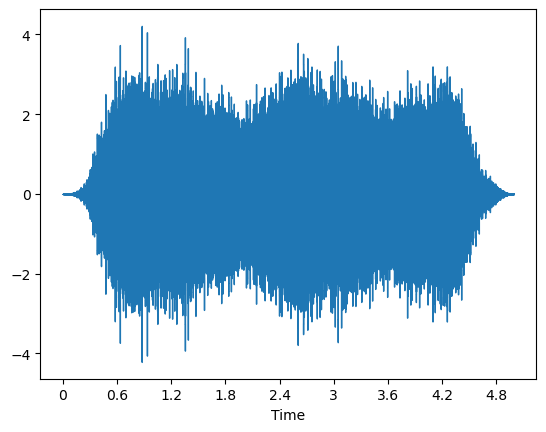

In [84]:
print("After scaling, normalized transform has values within this range: ", conv_data.min(), conv_data.max())
untrans_1 = Domain_to_Audio(conv_data, sr)
print("This is the recreated audio, (un-transformed) hear and see as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)
IPython.display.Audio(data = untrans_1, rate=sr)

## The above is what the AI "thinks bird class 0 - abethr1 - sounds like." 
If you'll forgive the personification, pretending like the AI is actually thinking
### What can we learn from the above?
* We can see that certain important frequencies appear in the same position (in the extracted feature image)
* We can see that certain important cadences (low to high notes, versus high to low notes) can be spotted
* Some information, such as rhythm/timing of repeated sounds, seems to be completely lost.
* We see that quite a bit of information has been thrown away (I can't tell what bird it is from the audio, and probabbly neither can an expert).
* Could this discarded information be important? Experts would say "yes" but AI researchers migth be OK with a good score only.

## Next is bird class 1 - "abhori1"
* We'll hear what an example original audio sounds like
* After that, we'll work backwards through the NN to approximate an input feature set (image) and from that audio best approximation
* Listen to what the NN has learned each bird "sounds like" - you may be surprised!

### Listen to an example of what that bird sounds like

Here is an example of original audio of this  African Black-headed Oriole  bird sounds like

This is the audio playback of the ORIGINAL audio file


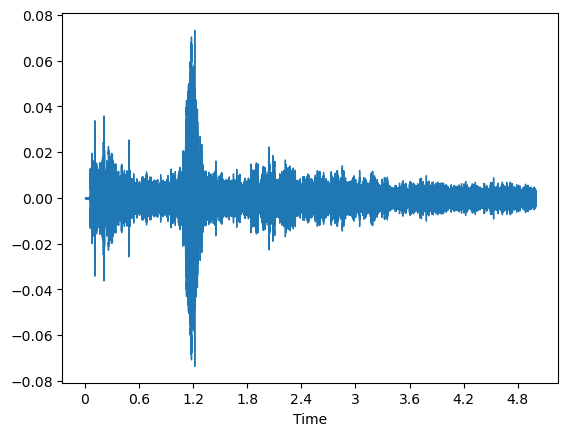

In [85]:
bird_class = 1
example_audio_index = 15
audio_filename = image_data.at[example_audio_index,"filename"]
common_name = image_data.at[example_audio_index,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]

print("Here is an example of original audio of this ", common_name, " bird sounds like\n")
librosa.display.waveshow(audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

### For the above example, show the extracted features

These are the features that will be used as input for the above example audio.



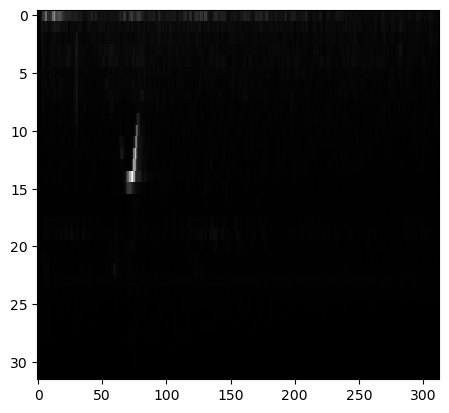

In [86]:
# These are the features for the above audio sample
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
print("These are the features that will be used as input for the above example audio.\n")
plt.imshow(feat, cmap='gray', aspect=int(num_columns/num_rows) , interpolation = 'None')
plt.show() 

### Force the output category of the NN to be the above bird

Here is the forced output of our classification layer (the last Dense layer with Softmax activation)


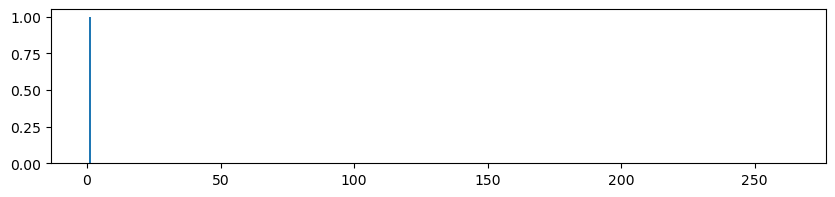

In [87]:
# Let's see if we can work backwards from a classification - in this case, we'll use the frst bird
bird_class = 1 # You can pick a different bird here if you wish
force_class = np.zeros(num_birds)
force_class[bird_class] = 1

print("Here is the forced output of our classification layer (the last Dense layer with Softmax activation)")
# Creating bar chart of Embed layer output values
x = np.arange(num_birds)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, force_class)

# Show plot
plt.show()

Weights array from the embed layer to the class layer has the shape  (64, 264)
Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)


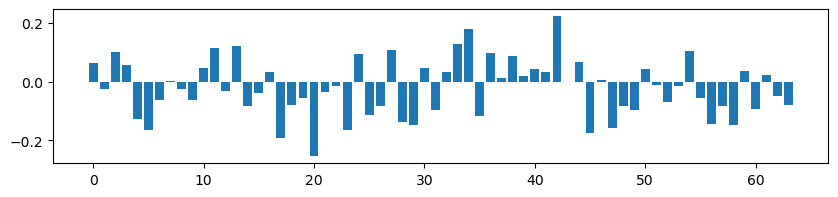

Weights array from the flattened last Conv layer to the embed has the shape  (19968, 64)


In [88]:
# Let's calculate the Embed layer for this forced classification
# Weights from the embed layer to the Classification layer
class_weights = np.copy(model_class.get_layer(index=class_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", class_weights.shape)

num_embed_neurons = class_weights.shape[0]
num_class_neurons = class_weights.shape[1]
embed_data = np.zeros(num_embed_neurons)
for i in range(num_embed_neurons):
    for j in range(num_class_neurons):
        embed_data[i] += force_class[j] * class_weights[i, j]

print("Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)")
# Creating bar chart of Embed layer output values
x = np.arange(num_embed_neurons)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, embed_data)

# Show plot
plt.show()

# Weights from the embed layer to the Flatten-ed last Conv layer
embed_weights = np.copy(model_embed.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the flattened last Conv layer to the embed has the shape ", embed_weights.shape)

### Work backwards through the NN to recreate a best approximation of the input features, and audio, of the above bird.
* Essentially "What has the NN learned to be the audio feature set for the above bird, and what does it sound like?"

Weights array from the embed layer to the class layer has the shape  (19968, 64)
Weights array shape from the embed layer after undoing the Flatten  (8, 78, 32, 64)
Here is the best approximation of the input for this bird



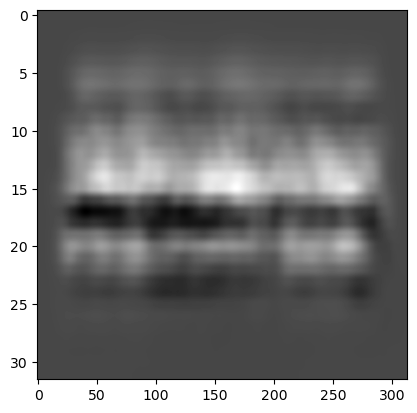

In [89]:
# Let's calculate the last Conv2D layer for this forced classification
# Weights from the last Conv2D layer to the embed layer
last_conv_weights_flat = np.copy(model.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", last_conv_weights_flat.shape)

last_conv_weights = np.copy(np.reshape(last_conv_weights_flat, pre_flatten))
print("Weights array shape from the embed layer after undoing the Flatten ", last_conv_weights.shape)

# The last convolutional network  is a 3 dimensional arrax of dimensions rows x columns x filters
num_conv_rows = last_conv_weights.shape[0]
num_conv_cols = last_conv_weights.shape[1]
num_conv_filt = last_conv_weights.shape[2]
# In addition, each of these rows x columns x filter outputs is connected to a dense layer with a number of neurons (called the embed layer)
num_embed_neurons = last_conv_weights.shape[3]

# As we build visualizations of each Convolutioal Layer, we cumulatively created "filter patches" that 
# represent all of the prior Convolutional layers as well. Because of this, we don't need to 
# recalculate each layer backwards. We can just use the forward calculated final convolutional layer
# filter patch
last_conv_layer = num_conv - 1
last_filter_patches = filter_patches[last_conv_layer]

# We will use the values of the embed layer (called embed_data here) multiplied by all
# the corresponding weights that connected the last convolutional layer to that embed
# layer (we took care of the "Flatten" above), and those values are the multiplier
# we will apply to each filter patch at the respective location of the recreation.
# In this way, we are moving backwards through the NN; from embed, to last Convolutional
# layer, and finally all the way to a best approximation of the input.
# NOTE: Since we used padding in the forward pass, we'll need to add a border to 
# our workspace input recreation
border = int(last_filter_patches.shape[0]/2) 
extra_pixels = 2 * border 

# Create the workspace where individual filter patchess will be weighted and added up
conv_data1 = np.zeros((num_conv_rows + extra_pixels, num_conv_cols + extra_pixels))
# add 'em up
for i in range(num_embed_neurons):
    embed_value = embed_data[i] # using local variables to speed things up
    for j in range(num_conv_filt):
        this_filter_patch = last_filter_patches[:,:,j]
        this_conv_to_embed_weights = last_conv_weights[:,:,j,i]
        for k in range(border, num_conv_cols + border, 1):
            for l in range(border, num_conv_rows + border, 1):
                conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * this_conv_to_embed_weights[l-border,k-border] * embed_value
                
conv_data2 = np.copy(conv_data1) # [border:num_conv_rows + border, border:num_conv_cols + border])
PIL_image = Image.fromarray(conv_data2)
conv_data = np.array(PIL_image.resize([num_columns, num_rows]))

print("Here is the best approximation of the input for this bird\n")
plt.imshow(conv_data, cmap="gray", aspect=(num_columns/num_rows))


In [90]:
x = model.predict(np.reshape(conv_data, (1, num_rows, num_columns, 1)))

print("As noted above, recreation of input does not mean that recreation will be classified the same way. \n",
      "Using the above as input, the NN categorizes this as bird number ", x.argmax())

1/1 [==============================] - 0s 33ms/step
As noted above, recreation of input does not mean that recreation will be classified the same way. 
 Using the above as input, the NN categorizes this as bird number  74


After scaling, normalized transform has values within this range:  -1.910937 4.9759054
This is the recreated audio, (un-transformed) hear and see as a graphic file


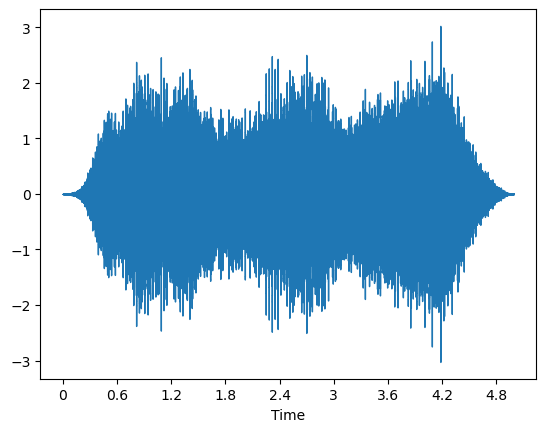

In [91]:
print("After scaling, normalized transform has values within this range: ", conv_data.min(), conv_data.max())
untrans_1 = Domain_to_Audio(conv_data, sr)
print("This is the recreated audio, (un-transformed) hear and see as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)
IPython.display.Audio(data = untrans_1, rate=sr)

## The above is what the AI "thinks bird class 1 - abhori1 - sounds like."
* Many of the same observations regarding retained vversus discarded information

## Finally bird class 2 - "abythr1"
* We'll hear what an example original audio sounds like
* After that, we'll work backwards through the NN to approximate an input feature set (image) and from that audio best approximation
* Listen to what the NN has learned each bird "sounds like" - you may be surprised!

### Listen to an example of what that bird sounds like

Here is an example of original audio of this  Abyssinian Thrush  bird sounds like

This is the audio playback of the ORIGINAL audio file


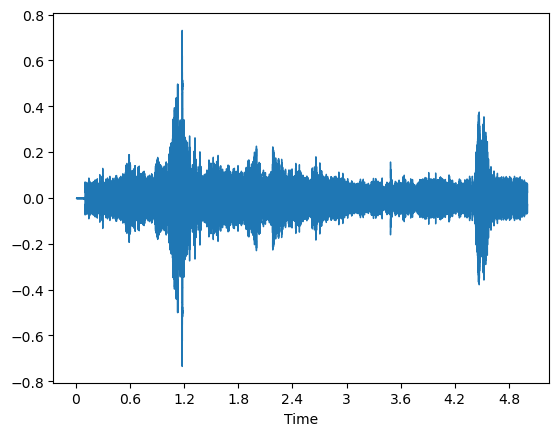

In [92]:
bird_class = 2
example_audio_index = 141
audio_filename = image_data.at[example_audio_index,"filename"]
common_name = image_data.at[example_audio_index,"common_name"]
# load the audio data
audio, sr = librosa.load("/kaggle/input/birdclef-2023/train_audio/" + audio_filename, sr = sr)
# Take first 5 second "segment"
audio = audio[0:segment]

print("Here is an example of original audio of this ", common_name, " bird sounds like\n")
librosa.display.waveshow(audio, sr=sr)

print("This is the audio playback of the ORIGINAL audio file")
IPython.display.Audio(data = audio, rate=sr)

### For the above example, show the extracted features

These are teh features that will be used as input for the above example audio.



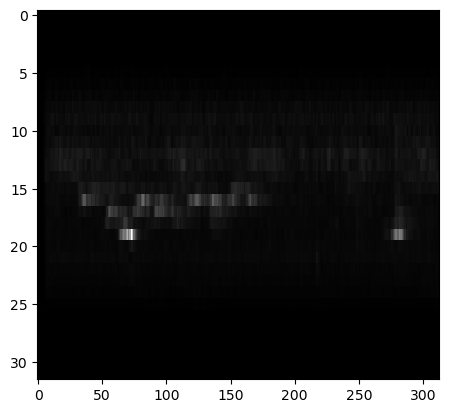

In [93]:
# These are the features for the above audio sample
feat = Audio_to_Domain(audio, sr)
# Move the range from current min and max, into 0 to 255 8 bit integers
fmin = feat.min()
fmax = feat.max()
frange = fmax - fmin
feat = np.array((((feat - fmin) / frange)*255), dtype='uint8')
print("These are teh features that will be used as input for the above example audio.\n")
plt.imshow(feat, cmap='gray', aspect=int(num_columns/num_rows) , interpolation = 'None')
plt.show() 

### Force the output category of the NN to be the above bird

Here is the forced output of our classification layer (the last Dense layer with Softmax activation)


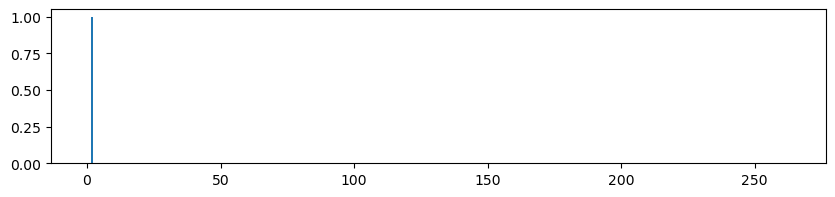

In [94]:
# Let's see if we can work backwards from a classification - in this case, we'll use the frst bird
bird_class = 2 # You can pick a different bird here if you wish
force_class = np.zeros(num_birds)
force_class[bird_class] = 1

print("Here is the forced output of our classification layer (the last Dense layer with Softmax activation)")
# Creating bar chart of Embed layer output values
x = np.arange(num_birds)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, force_class)

# Show plot
plt.show()

Weights array from the embed layer to the class layer has the shape  (64, 264)
Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)


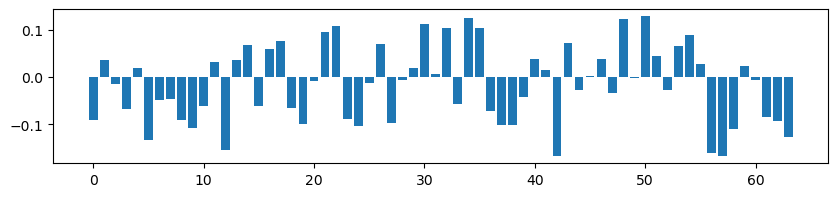

Weights array from the flattened last Conv layer to the embed has the shape  (19968, 64)


In [95]:
# Let's calculate the Embed layer for this forced classification
# Weights from the embed layer to the Classification layer
class_weights = np.copy(model_class.get_layer(index=class_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", class_weights.shape)

num_embed_neurons = class_weights.shape[0]
num_class_neurons = class_weights.shape[1]
embed_data = np.zeros(num_embed_neurons)
for i in range(num_embed_neurons):
    for j in range(num_class_neurons):
        embed_data[i] += force_class[j] * class_weights[i, j]

print("Here is the forced output of our embed layer (the first Dense layer after flattened last Conv layer)")
# Creating bar chart of Embed layer output values
x = np.arange(num_embed_neurons)

fig, ax = plt.subplots(figsize =(10, 2))
ax.bar(x, embed_data)

# Show plot
plt.show()

# Weights from the embed layer to the Flatten-ed last Conv layer
embed_weights = np.copy(model_embed.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the flattened last Conv layer to the embed has the shape ", embed_weights.shape)

### Work backwards through the NN to recreate a best approximation of the input features, and audio, of the above bird.
* Essentially "What has the NN learned to be the audio feature set for the above bird, and what does it sound like?"

Weights array from the embed layer to the class layer has the shape  (19968, 64)
Weights array shape from the embed layer after undoing the Flatten  (8, 78, 32, 64)
Here is the best approximation of the input for this bird



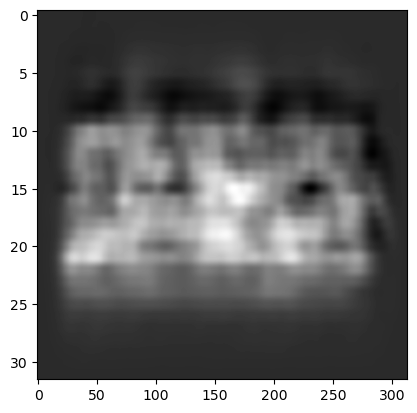

In [96]:
# Let's calculate the last Conv2D layer for this forced classification
# Weights from the last Conv2D layer to the embed layer
last_conv_weights_flat = np.copy(model.get_layer(index=embed_layer).get_weights()[0])
print("Weights array from the embed layer to the class layer has the shape ", last_conv_weights_flat.shape)

last_conv_weights = np.copy(np.reshape(last_conv_weights_flat, pre_flatten))
print("Weights array shape from the embed layer after undoing the Flatten ", last_conv_weights.shape)

# The last convolutional network  is a 3 dimensional arrax of dimensions rows x columns x filters
num_conv_rows = last_conv_weights.shape[0]
num_conv_cols = last_conv_weights.shape[1]
num_conv_filt = last_conv_weights.shape[2]
# In addition, each of these rows x columns x filter outputs is connected to a dense layer with a number of neurons (called the embed layer)
num_embed_neurons = last_conv_weights.shape[3]

# As we build visualizations of each Convolutioal Layer, we cumulatively created "filter patches" that 
# represent all of the prior Convolutional layers as well. Because of this, we don't need to 
# recalculate each layer backwards. We can just use the forward calculated final convolutional layer
# filter patch
last_conv_layer = num_conv - 1
last_filter_patches = filter_patches[last_conv_layer]

# We will use the values of the embed layer (called embed_data here) multiplied by all
# the corresponding weights that connected the last convolutional layer to that embed
# layer (we took care of the "Flatten" above), and those values are the multiplier
# we will apply to each filter patch at the respective location of the recreation.
# In this way, we are moving backwards through the NN; from embed, to last Convolutional
# layer, and finally all the way to a best approximation of the input.
# NOTE: Since we used padding in the forward pass, we'll need to add a border to 
# our workspace input recreation.
border = int(last_filter_patches.shape[0]/2) 
extra_pixels = 2 * border 

# Create the workspace where individual filter patchess will be weighted and added up
conv_data1 = np.zeros((num_conv_rows + extra_pixels, num_conv_cols + extra_pixels))
# add 'em up
for i in range(num_embed_neurons):
    embed_value = embed_data[i] # using local variables to speed things up
    for j in range(num_conv_filt):
        this_filter_patch = last_filter_patches[:,:,j]
        this_conv_to_embed_weights = last_conv_weights[:,:,j,i]
        for k in range(border, num_conv_cols + border, 1):
            for l in range(border, num_conv_rows + border, 1):
                conv_data1[l-border:l+border+1, k-border:k+border+1] += this_filter_patch[:,:] * this_conv_to_embed_weights[l-border,k-border] * embed_value
                
conv_data2 = np.copy(conv_data1)
PIL_image = Image.fromarray(conv_data2)
conv_data = np.array(PIL_image.resize([num_columns, num_rows]))

print("Here is the best approximation of the input for this bird\n")
plt.imshow(conv_data, cmap="gray", aspect=(num_columns/num_rows))


In [97]:
x = model.predict(np.reshape(conv_data, (1, num_rows, num_columns, 1)))

print("As noted above, recreation of input does not mean that recreation will be classified the same way. \n",
      "In fact, using the above as input, the NN categorizes this as bird number ", x.argmax())


1/1 [==============================] - 0s 31ms/step
As noted above, recreation of input does not mean that recreation will be classified the same way. 
 In fact, using the above as input, the NN categorizes this as bird number  123


After scaling, normalized transform has values within this range:  -0.46554467 2.3489199
This is the recreated audio, (un-transformed) hear and see as a graphic file


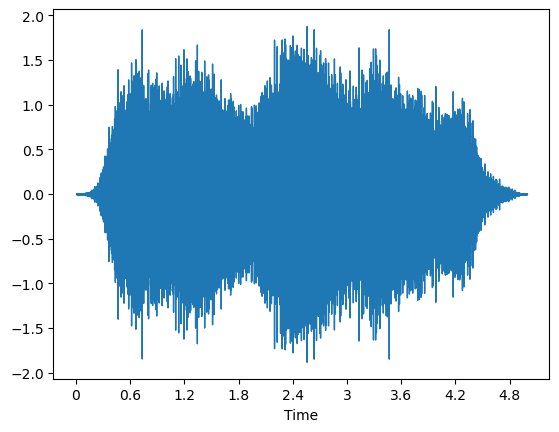

In [98]:
print("After scaling, normalized transform has values within this range: ", conv_data.min(), conv_data.max())
untrans_1 = Domain_to_Audio(conv_data, sr)
print("This is the recreated audio, (un-transformed) hear and see as a graphic file")
librosa.display.waveshow(untrans_1, sr=sr)
IPython.display.Audio(data = untrans_1, rate=sr)

## The above is what the AI "thinks bird class 2 - abythr1 - sounds like."
* Many of the same observations regarding retained vversus discarded information

# Submit the Results
* You will likely run this notebook twice or three times - first to create all the training set images, then to train a NN, and finally to use that trained NN to infer solutions to the contest.
* I have included all of the code - including submission to the contest - to make this easier for you.

Below code modified from "Inferring Birds with Kaggle Models", courtesy PHIL CULLITON +1 · COPIED FROM PRIVATE NOTEBOOK +42,-5 · 1MO AGO · 22,483 VIEWS

In [99]:
def predict_for_sample(filename, sample_submission, frame_limit_secs=None):
    file_id = filename.split(".ogg")[0].split("/")[-1]
    
    audio, sample_rate = librosa.load(filename, sr = sr)
        
    # Get number of samples for 5 seconds
    buffer = segment

    samples_total = len(audio)
    samples_segmented = 0
    counter = 1

    frame = 5

    # this will be a list of 5 second segments
    feature_split = []
    classifications = []

    if num_birds < len(competition_class_map):
        print("Have to append 0% likelihood bird types because only ", num_birds, "were used in taining\n")

    while samples_segmented < samples_total:
        #check if the buffer is not exceeding total samples 
        if buffer > (samples_total - samples_segmented):
            buffer = samples_total - samples_segmented

        block = audio[samples_segmented : (samples_segmented + buffer)]

        # convert the features 
        these_features = Audio_to_Domain(block, sr)

        #scale to 0 - 255
        fmax = these_features.max()
        fmin = these_features.min()
        frange = fmax - fmin
            
        these_features = np.array((((these_features - fmin) / frange)*255))
        feature_split.append(these_features)

        # Classfy each 5 secons segment
        scratch = np.copy(np.reshape(these_features, (1,num_rows, num_columns, 1)))
        scratch2 = (model.predict(scratch, verbose=0))
        classifications.append(scratch2)
        
        counter += 1
        samples_segmented += buffer
                
        probabilities = tf.nn.softmax(scratch2).numpy()
        probabilities = np.copy(np.reshape(probabilities, (num_birds)))
        if num_birds < len(competition_class_map) :
            probabilities = np.append(probabilities, np.zeros(len(competition_class_map) - num_birds))
            print("Had to append bird types because only ", num_birds, "were used in taining")
        print(samples_segmented, samples_total)
        
        ## set the appropriate row in the sample submission
        sample_submission.loc[sample_submission.row_id == file_id + "_" + str(frame), competition_classes] = probabilities[competition_class_map]
        frame += 5
        
def predict_for_sample(filename, sample_submission, frame_limit_secs=None):
    file_id = filename.split(".ogg")[0].split("/")[-1]
    
    audio, sample_rate = librosa.load(filename, sr = sr)
        
    # Get number of samples for 5 seconds
    buffer = segment

    samples_total = len(audio)
    samples_segmented = 0
    counter = 1

    frame = 5

    # this will be a list of 5 second segments
    feature_split = []
    classifications = []

    if num_birds < len(competition_class_map):
        print("Had to append bird types because only ", num_birds, "were used in taining")
    while samples_segmented < samples_total:
        #check if the buffer is not exceeding total samples 
        if buffer > (samples_total - samples_segmented):
            buffer = samples_total - samples_segmented

        block = audio[samples_segmented : (samples_segmented + buffer)]

        # convert the features 
        these_features = Audio_to_Domain(block, sr)

        #scale to 0 - 255
        fmax = these_features.max()
        fmin = these_features.min()
        frange = fmax - fmin
            
        these_features = np.array((((these_features - fmin) / frange)*255))
        feature_split.append(these_features)

        # Classfy each 5 second segment
        scratch = np.copy(np.reshape(these_features, (1, num_rows, num_columns, 1)))
        scratch2 = (model.predict(scratch, verbose = 1))
        classifications.append(scratch2)
        
        counter += 1
        samples_segmented += buffer
                
        probabilities = tf.nn.softmax(scratch2).numpy()
        probabilities = np.copy(np.reshape(probabilities, (num_birds)))
        if num_birds < len(competition_class_map) :
            probabilities = np.append(probabilities, np.zeros(len(competition_class_map) - num_birds))
        # print(samples_segmented, samples_total)
        
        ## set the appropriate row in the sample submission
        sample_submission.loc[sample_submission.row_id == file_id + "_" + str(frame), competition_classes] = probabilities[competition_class_map]
        frame += 5

In [100]:
import glob
test_samples = list(glob.glob("/kaggle/input/birdclef-2023/test_soundscapes/*.ogg"))
test_samples

['/kaggle/input/birdclef-2023/test_soundscapes/soundscape_29201.ogg']

In [101]:
train_metadata = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv")
competition_classes = sorted(train_metadata.primary_label.unique())

competition_class_map = []
for c in competition_classes:
        i = competition_classes.index(c)
        competition_class_map.append(i)
        

sample_sub = pd.read_csv("/kaggle/input/birdclef-2023/sample_submission.csv")
sample_sub[competition_classes] = sample_sub[competition_classes].astype(np.float32)
sample_sub.head()

,row_id,abethr1,abhori1,abythr1,afbfly1,afdfly1,afecuc1,affeag1,afgfly1,afghor1,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,soundscape_29201_5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,soundscape_29201_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,soundscape_29201_15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [102]:
frame_limit_secs = 15 if sample_sub.shape[0] == 3 else None
for sample_filename in test_samples:
    predict_for_sample(sample_filename, sample_sub, frame_limit_secs=15)

1/1 [==============================] - 0s 46ms/step


In [103]:
sample_sub

,row_id,abethr1,abhori1,abythr1,afbfly1,afdfly1,afecuc1,affeag1,afgfly1,afghor1,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,soundscape_29201_5,0.003777,0.003773,0.003800,0.003772,0.003772,0.003818,0.003772,0.003772,0.003822,...,0.003772,0.003772,0.003773,0.003772,0.003772,0.003772,0.003772,0.003772,0.003772,0.003774
1,soundscape_29201_10,0.003777,0.003785,0.003781,0.003778,0.003774,0.003776,0.003774,0.003775,0.003775,...,0.003773,0.003775,0.003799,0.003782,0.003773,0.003774,0.003773,0.003773,0.003774,0.003775
2,soundscape_29201_15,0.003774,0.003775,0.003794,0.003776,0.003773,0.003776,0.003772,0.003773,0.003773,...,0.003772,0.003773,0.003788,0.003776,0.003772,0.003772,0.003772,0.003773,0.003772,0.003773


In [104]:
sample_sub.to_csv("submission.csv", index=False)

# Additional Background Information
As you know, in this notebook, we are taking the first step to generate a submission to the [BirdClef2023 competition](https://www.kaggle.com/c/birdclef-2023).  The goal of the competition is to identify Eastern African bird species by sound. 
### "Reading the Robot Mind" is a system that allows non-programmers to examine performance of individual and combined stages of the classification process
Most important for this system is that it can be accomplished by a subject matter expert who may not be familair with the inner workings of AI. Subject matter experts know how to listen to birds and identify them, so they need data presented as audio (and possibly spectral analysis, as I've seen this used extensively by experts when exmining data). Additional references and history of the reading the robot mind system is explained in detail below. 
#### Stages of an automated process to classify birds:
The stages of the desired classification system include:

* A method to record audio (provided with the contest)
* A method of segmenting audio data (somewhat provided with the contest - 5 second segments)
* A method of transforming the audio segment into a sequence of feature vectors (feature extraction such as Mel Scale Frequency Spectrum and MFCC)
* A method of converting sequence of features into an image for CNN processing (in this case, also quantizing to 8-bit unsigned values)
* A method where several CNN (Conv2D) and data reduction (MaxPooling) layers process data in sequence, iteratively extracting salient aspects
* A method of taking a multi-layer CNN and outputting an embedding (Flatten then Dense layer)
* A method of taking the embedding and converting it to a bird classification (Dense with softmax activation)

Prior to the "Reading the Robot Mind" system described herein; a subject matter expert will not be able to examine issues associated with individual stages (such as listening to audio and looking at visualizations) except for the first two stages. Issues that can arise include: Inability to observe the difference between samples from different bird classifications. Inability to observe similarities between samples from the same bird classification. Inability to use audio and visual clues to correctly classify the bird.

This notebook presents a method whereby at any stage of the classification system, the expert can examine the internal workings of the system, and work backwards to audio and visual data in a way that is interpretable by a human expert.
### We will qualitatively examine feature extraction algorithms as part of an effort to "Read the Robot Mind"
This notebook creates a method to allow users to select different hyper-paramenters (methods) at each stage and qualitatively compare them. Variations of segmentation algorithms are not presented in this notebook (since they are dictated to some extent by the rules of this competition).
### Also examined is the Neural Network we trained. Can it too be used to "Read the Robot Mind?"
Here we train a simple NN and see that it can classify with some level of accuracy. We can then use that NN "in reverse" to attempt to recreate an audio signal that generated a particular stage (often referred to as a layer) in the classification.
### Finally - what if we simply supply a classification?
This notebook demonstrates the ability to simply provide the output - and then work backwards through the AI layers and reproduce a best approximation of the input that cause this classification. Effectively asking the AI system to "Let me hear what you've learned a particular bird sounds like."

# Brief History of the "Reading the Robot Mind" System
It used to be that only human experts examined data and made decisions. Now Artificial Intelligence (AI) is enabling robotic decision making in an ever-widening variety of applications. As society allows this to happen, there is a greater likelihood that these robot decisions can affect people’s lives. It makes sense, therefore, to understand the capabilities and societal implications of AI robots.

Big data is a term used to describe both the opportunities and the problems associated with so much information now available for decision making. With the advent of the Internet of Things (IoT) the impact of this huge amount of data is only growing. Actionable decisions need to be distilled from big data and AI can only go so far based on statistical analysis. Because of this, many deep learning algorithms are being developed. 

##  What exactly have these AI robots learned so deeply from all of this big data? 

This question is very reasonable for society to ask. It is not enough to train and create a great AI robot. Many researchers are realizing that before their systems can be deployed, they must be able to prove to human experts that the robots learned the right things from the right data. This is difficult because human expert decision makers are not necessarily the same people who are good at creating robot AI. These two teams must work together in a user friendly way.
## If only we could read the robot mind.
Recently some old research of mine has been getting increased attention by engineers and scientists working on exactly the issues discussed above. This research yielded four US patents and a Windows app that gives a friendly user interface to allow examination of big data and inner workings of a trained AI decision maker. I never publically released the software, called INTEGRAT, because I sold rights to the patents to my employer at the time. 

## Now that the patents have expired, I can share my work.

* For even more details, the reader is directed to the specific patent and independent claims listed below, all publically available at www.USPTO.gov.


# US Patent 5809462
Paul A. Nussbaum, Inventor
## Question: Is the feature extraction algorithm good and can the features be used as a codec?
("codec" is a portmanteau or combination of the words "coder" and "decoder", such as jpeg or mp3, etc...)

All AI systems train on data from the real world gathered by sensors, but before the data can make it to the AI, it must be digitized and important features must be extracted (sometimes called data transformation). "Reading the Robot Mind" allows a human expert to determine if the features extracted have retained sufficient information to identify the correct classification. 

* The question is: does the feature extraction algorithm retain classification-necessary information (or have we thrown away too much information)?

* The premise is as follows: Human experts can observe the original signal and/or measurements and visualizations thereof - and correctly make the classification. 

* The thesis is that: A sufficient condition that the feature extraction algorithm isn't throwing away too much info as it seeks to condition and compress the signal; is that there exists a reverse transformation able to use the extracted features to recreate the original signal and/or measurements and visualizations thereof - such that the human expert will use these to correctly make the classification.

* A bonus is: The human expert can also be presented the extracted features, and may find that they can be useful in future human classification exercises (observedly similar for same classifications, while different from others).

Salient points from US Patent 5809462:

* Independent Claim 1 – Provide a friendly user interface to present the features to the eyes and ears of the human expert to see if they can make the correct decisions based on the transformation features alone.
   
* Independent Claim 14 – Use that same user interface to let the human expert make sure that the data used to train one possible decision all seem similar to each other, and different from data which should yield different decisions.
   
* Independent Claim 25 – Let the human expert see if the features contain enough information to be used as a codec. In other words, if we can transform the original data into a set of features, we should be able to create original data (somewhat distorted and simplified perhaps) from the features – with sufficient information for a human expert to use that to identify the correct decision. 


# US Patent 5867816
Paul A. Nussbaum, Inventor
## Question: Will the robot function just as well when the data segmentation, feature extraction, and decision identifier are fully automated?

The AI Robot is not useful if it requires a human expert to accompany the device when it is deployed in the field for day to day use. The robot must work on its own. Nevertheless, a quality assurance mechanism is required that makes the robot demonstrate it is working in “fully automatic” mode while a human expert grades it on the decisions the AI has made.

* "Reading the Robot Mind" means that this segmentation, feature extraction, and classifier pipeline (inference) are observable in situ (on-site in real deployed situations, preferably live).

* Bonus: The human expert can make adjustments to this pipeline to help get the desired classification accuracy, without requiring technical knowledge of the pipeline.

In the BirdClef2023 

The salient point from US Patent 5867816 is:

* Independent Claims 1, 11, and 29 – The human expert examines and modifies the segmentation, features, and decision identifications to improve automated functioning.


# US Patent 5749066
Paul A. Nussbaum, Inventor
## Question: Is the training data good and can the classifier be used as a codec? 

AI robots can be finicky about the actual examples selected to be used for training. Giving too many of one kind of example can have a negative impact on the resulting decision maker, as can the introduction of misleading data examples (either accidentally or maliciously). Sometimes, a training set can be obviously bad, and other times, only after the AI is trained, can the human expert see that something has gone wrong.
   
* Independent Claims 1 and 7 - Provide a friendly user interface to present all stages of creating the training set to the eyes and ears of the human expert to see if they can spot any problems noted above.

* Independent Claim 3 – Let the human expert see if the AI can be used as a codec. In other words, if the AI can identify the correct decision, then we can work backwards through the AI layers to recreate an exemplary feature set. We can then create the original data (somewhat distorted and simplified perhaps) from those features – with sufficient information for a human expert to use that to identify the correct decision.


#  US Patent 5864803
This Notebook DOES NOT cover these aspects in detail
## Question: How can we assign more than one correct classification when experts cannot agree?
Because data sets can be very large and continuously streaming in from many sources, AI robot creators will chop up the data into segments that can be presented to identify a decision. Sometimes different human experts will see the same data segment and identify different decisions. Similarly, sometimes a human expert will examine one data segment and come up with two possible decisions, each of which are valid. INTEGRAT accounts for this situation in all stages of the creation and testing of the data and the AI robot.
* Independent Claims 1 and 6 - Provide a friendly user interface to present data segments to the human expert and let them change the segmentation algorithm, or manually change a segment, if it could yield more than one decision.
* Independent Claims 13, 17, and 20 – Provide a mechanism whereby multiple “correct” decisions can be assigned to one data segment, as well as AI training algorithms to support this ambiguity. Finally, allow the AI robot to come up with a single “best” decision when presented with ambiguous data, while also alerting users to “second best” decisions, and so on.
